# MVTec AD - Surface Classification
**Models:** YOLO11n-cls | EfficientNet-B0 | MobileNetV3-Small

**Classes:** Carpet | Grid | Leather | Tile | Wood | Unknown / Rejected

**Pipeline:** Dataset -> Augmentation -> Training -> Evaluation -> Comparison -> Interactive Upload Inference



# Section 1 - Environment Setup and Dependencies

## Mount Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Install Dependencies

In [2]:
!pip install ultralytics timm torchmetrics seaborn scikit-learn matplotlib pandas numpy pillow tqdm -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 36.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 80.8 MB/s eta 0:00:00


## Import Libraries and Set Seed

Loads all required packages, sets random seeds for reproducibility, and detects the available compute device.

In [3]:
import os
import json
import copy
import time
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from pathlib import Path
from PIL import Image
from tqdm import tqdm
from collections import defaultdict

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
import torchvision.models as models
from torchmetrics import Accuracy, F1Score, Precision, Recall, ConfusionMatrix, AUROC

import timm
from ultralytics import YOLO

warnings.filterwarnings('ignore')

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {DEVICE}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Device: cuda
GPU: NVIDIA L4


# Section 2 - Configuration

In [63]:
# ----------------------------------------------------------------
# ROOT PATH - set this to your dataset folder in Drive
# ----------------------------------------------------------------
ROOT_PATH = '/content/drive/MyDrive/Colab Notebooks/ICT304/object_class'
# ----------------------------------------------------------------

CHECKPOINT_DIR = os.path.join(ROOT_PATH, 'checkpoints')
RESULTS_DIR    = os.path.join(ROOT_PATH, 'results')
CLASSES_JSON   = os.path.join(ROOT_PATH, 'classes.json')

os.makedirs(CHECKPOINT_DIR, exist_ok=True)
os.makedirs(RESULTS_DIR,    exist_ok=True)

SURFACE_CLASSES = ['carpet', 'grid', 'leather', 'tile', 'wood']
UNKNOWN_CLASS   = 'unknown'
CONFIDENCE_THRESHOLD = 0.80

classes_data = {
    'classes': SURFACE_CLASSES,
    'unknown_class': UNKNOWN_CLASS,
    'confidence_threshold': CONFIDENCE_THRESHOLD,
    'num_classes': len(SURFACE_CLASSES),
    'class_to_idx': {cls: i for i, cls in enumerate(SURFACE_CLASSES)},
    'idx_to_class': {i: cls for i, cls in enumerate(SURFACE_CLASSES)}
}

with open(CLASSES_JSON, 'w') as f:
    json.dump(classes_data, f, indent=2)

print('Classes JSON saved to:', CLASSES_JSON)
print(json.dumps(classes_data, indent=2))


Classes JSON saved to: /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/classes.json
{
  "classes": [
    "carpet",
    "grid",
    "leather",
    "tile",
    "wood"
  ],
  "unknown_class": "unknown",
  "confidence_threshold": 0.8,
  "num_classes": 5,
  "class_to_idx": {
    "carpet": 0,
    "grid": 1,
    "leather": 2,
    "tile": 3,
    "wood": 4
  },
  "idx_to_class": {
    "0": "carpet",
    "1": "grid",
    "2": "leather",
    "3": "tile",
    "4": "wood"
  }
}


## Training Hyperparameters

In [48]:
IMG_SIZE     = 224
BATCH_SIZE   = 32
NUM_EPOCHS   = 30
NUM_WORKERS  = 2
VAL_SPLIT    = 0.15
TEST_SPLIT   = 0.15


YOLO_LR      = 0.001
EFFNET_LR    = 1e-4
MOBILENET_LR = 1e-4

WEIGHT_DECAY = 1e-4
SCHEDULER_PATIENCE = 4
EARLY_STOP_PATIENCE = 13


# Section 3 - Dataset Structure and MVTec Paths

## Extract Dataset Archives

Copies and extracts per-class `.tar.xz` archives from Google Drive to local disk for faster I/O during training.

In [9]:
import tarfile
import shutil
import os

DRIVE_DATA  = '/content/drive/MyDrive/Colab Notebooks/ICT304/object_class'
LOCAL_DATA  = '/content/data'

os.makedirs(LOCAL_DATA, exist_ok=True)

for cls in SURFACE_CLASSES:
    target = os.path.join(LOCAL_DATA, cls)

    if os.path.isdir(target):
        print(f'{cls} - already extracted, skipping')
        continue

    archive_drive = os.path.join(DRIVE_DATA, f'{cls}.tar.xz')
    archive_local = os.path.join(LOCAL_DATA, f'{cls}.tar.xz')

    if not os.path.exists(archive_drive):
        print(f'{cls} - archive not found: {archive_drive}')
        continue

    print(f'Copying {cls} from Drive...')
    shutil.copy2(archive_drive, archive_local)
    print(f'Extracting {cls}...')

    with tarfile.open(archive_local, 'r:xz') as tar:
        tar.extractall(LOCAL_DATA)

    os.remove(archive_local)
    print(f'{cls} - done, archive deleted to save space')

ROOT_PATH = LOCAL_DATA
print(f'\nAll done. ROOT_PATH set to: {ROOT_PATH}')

Copying carpet from Drive...
Extracting carpet...
carpet - done, archive deleted to save space
Copying grid from Drive...
Extracting grid...
grid - done, archive deleted to save space
Copying leather from Drive...
Extracting leather...
leather - done, archive deleted to save space
Copying tile from Drive...
Extracting tile...
tile - done, archive deleted to save space
Copying wood from Drive...
Extracting wood...
wood - done, archive deleted to save space

All done. ROOT_PATH set to: /content/data


## Cleanup Extracted Files

Removes extracted class directories from local disk to free space when needed.

## Dataset Population and Equalization

Augments training data by copying a proportion of defect images from the test split, then equalizes class counts by duplicating good samples up to a per-class cap.

In [10]:
import shutil
import math

def get_all_image_paths(root: str, surface_classes: list):
    valid_exts = {'.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff'}
    samples = []
    for idx, cls in enumerate(surface_classes):
        cls_dir = os.path.join(root, cls, 'train')
        if not os.path.isdir(cls_dir):
            continue
        for subdir, _, files in os.walk(cls_dir):
            for fname in files:
                if os.path.splitext(fname)[1].lower() in valid_exts:
                    samples.append((os.path.join(subdir, fname), idx))
    return samples

def populate_and_equalize_v2(root: str, surface_classes: list, defect_map: dict,
                              class_caps: dict, max_good_copies: int = 20):
    valid_exts = {'.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff'}
    train_only_paths = set()

    for cls in surface_classes:
        cap = class_caps.get(cls, 310)

        all_now = get_all_image_paths(root, surface_classes)
        current = sum(1 for _, l in all_now if surface_classes[l] == cls)
        remaining_budget = cap - current

        if remaining_budget <= 0:
            print(f'  {cls:10s}: already at {current}, skipping defect copy')
            continue

        defects = defect_map.get(cls, [])
        if not defects:
            continue

        # --- Proportional-ratio sampling ---
        available = {}
        for defect in defects:
            src_dir = os.path.join(root, cls, 'test', defect)
            if not os.path.isdir(src_dir):
                available[defect] = 0
                continue
            imgs = sorted([f for f in os.listdir(src_dir)
                           if os.path.splitext(f)[1].lower() in valid_exts])
            available[defect] = math.ceil(len(imgs) * 0.5)

        total_available = sum(available.values()) or 1
        budgets = {
            defect: math.floor(remaining_budget * (avail / total_available))
            for defect, avail in available.items()
        }
        leftover = remaining_budget - sum(budgets.values())
        if leftover > 0:
            budgets[max(available, key=available.get)] += leftover
        # -----------------------------------

        for defect in defects:
            src_dir = os.path.join(root, cls, 'test', defect)
            if not os.path.isdir(src_dir):
                continue

            dst_dir = os.path.join(root, cls, 'train', defect)
            os.makedirs(dst_dir, exist_ok=True)

            images = sorted([f for f in os.listdir(src_dir)
                             if os.path.splitext(f)[1].lower() in valid_exts])

            half           = images[:math.ceil(len(images) * 0.5)]
            budget_for_def = budgets.get(defect, 0)
            to_copy        = half[:min(len(half), budget_for_def)]

            copied = 0
            for fname in to_copy:
                src_path = os.path.join(src_dir, fname)
                stem, ext = os.path.splitext(fname)
                dst_name  = f'{stem}_c0{ext}'
                dst_path  = os.path.join(dst_dir, dst_name)
                shutil.copy2(src_path, dst_path)
                train_only_paths.add(os.path.realpath(dst_path))
                copied += 1

            print(f'  {cls}/{defect}: {len(images)} total, {copied} copied (proportional budget={budget_for_def})')

    # recount
    all_samples = get_all_image_paths(root, surface_classes)
    label_counts = defaultdict(int)
    for _, lbl in all_samples:
        label_counts[surface_classes[lbl]] += 1

    print('\nAfter defect population:')
    for cls, cnt in label_counts.items():
        print(f'  {cls:10s}: {cnt}')

    # equalize with good copies up to cap
    target = min(min(class_caps.values()), min(label_counts.values()) + max_good_copies)
    print(f'\nTarget for equalization: {target}')

    for cls in surface_classes:
        current = label_counts[cls]
        cap     = class_caps.get(cls, 310)
        needed  = min(cap, target) - current

        if needed <= 0:
            print(f'  {cls:10s}: {current}, no good copies needed')
            continue

        copies   = min(needed, max_good_copies)
        good_dir = os.path.join(root, cls, 'train', 'good')
        sources  = sorted([os.path.join(good_dir, f) for f in os.listdir(good_dir)
                           if os.path.splitext(f)[1].lower() in valid_exts])

        dst_dir = os.path.join(root, cls, 'train', 'equalizer')
        os.makedirs(dst_dir, exist_ok=True)

        for k in range(copies):
            src_path = sources[k % len(sources)]
            fname    = os.path.splitext(os.path.basename(src_path))[0]
            dst_path = os.path.join(dst_dir, f'{fname}_eq{k}.png')
            shutil.copy2(src_path, dst_path)
            train_only_paths.add(os.path.realpath(dst_path))  # lock the copy
            train_only_paths.add(os.path.realpath(src_path))  # lock the source original

        print(f'  {cls:10s}: {current} -> {current + copies} (added {copies} good copies)')

    all_samples = get_all_image_paths(root, surface_classes)
    label_counts = defaultdict(int)
    for _, lbl in all_samples:
        label_counts[surface_classes[lbl]] += 1

    print('\nFinal samples per class:')
    for cls, cnt in label_counts.items():
        good = sum(1 for p, l in all_samples if surface_classes[l] == cls and '/good/' in p)
        bad  = sum(1 for p, l in all_samples if surface_classes[l] == cls and '/good/' not in p)
        print(f'  {cls:10s}: total={cnt}  good={good}  bad={bad}')
    print(f'Total: {len(all_samples)}')

    return all_samples, train_only_paths

DEFECT_MAP = {
    'carpet':  ['color', 'cut', 'hole', 'metal_contamination', 'thread'],
    'grid':    ['bent', 'broken', 'glue', 'metal_contamination', 'thread'],
    'leather': ['color', 'cut', 'fold', 'glue', 'poke'],
    'tile':    ['crack', 'glue_strip', 'gray_stroke', 'oil', 'rough'],
    'wood':    ['color', 'combined', 'hole', 'liquid', 'scratch'],
}

all_samples, train_only_paths = populate_and_equalize_v2(
    LOCAL_DATA, SURFACE_CLASSES, DEFECT_MAP,
    class_caps={
        'carpet':  320,
        'grid':    310,
        'leather': 310,
        'tile':    310,
        'wood':    310,
    },
    max_good_copies=20
)

  carpet/color: 19 total, 10 copied (proportional budget=11)
  carpet/cut: 17 total, 7 copied (proportional budget=7)
  carpet/hole: 17 total, 7 copied (proportional budget=7)
  carpet/metal_contamination: 17 total, 7 copied (proportional budget=7)
  carpet/thread: 19 total, 8 copied (proportional budget=8)
  grid/bent: 12 total, 6 copied (proportional budget=10)
  grid/broken: 12 total, 6 copied (proportional budget=9)
  grid/glue: 11 total, 6 copied (proportional budget=9)
  grid/metal_contamination: 11 total, 6 copied (proportional budget=9)
  grid/thread: 11 total, 6 copied (proportional budget=9)
  leather/color: 19 total, 10 copied (proportional budget=15)
  leather/cut: 19 total, 10 copied (proportional budget=13)
  leather/fold: 17 total, 9 copied (proportional budget=12)
  leather/glue: 19 total, 10 copied (proportional budget=13)
  leather/poke: 18 total, 9 copied (proportional budget=12)
  tile/crack: 17 total, 9 copied (proportional budget=20)
  tile/glue_strip: 18 total, 9

# Section 4 - Dataset Statistics


--- Dataset Summary Statistics ---
  Class  Count  Percentage  Avg Width  Avg Height
 Carpet    319       21.38       1024        1024
   Grid    294       19.71       1024        1024
Leather    293       19.64       1024        1024
   Tile    293       19.64        840         840
   Wood    293       19.64       1024        1024
  TOTAL   1492      100.00        987         987


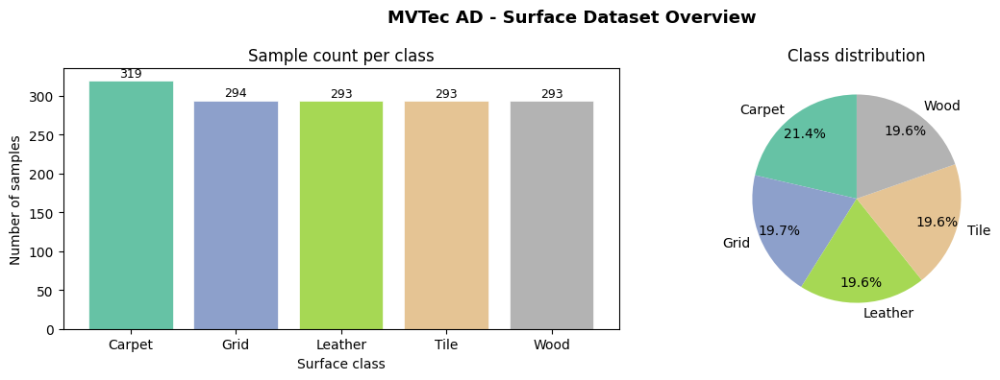

In [11]:
def compute_dataset_statistics(samples: list, surface_classes: list) -> pd.DataFrame:
    """
    Computes summary statistics per class from the sample list.
    Includes count, percentage, and sample image size.
    """
    class_to_idx = {cls: i for i, cls in enumerate(surface_classes)}
    stats = []

    for cls in surface_classes:
        idx     = class_to_idx[cls]
        paths   = [p for p, l in samples if l == idx]
        count   = len(paths)
        pct     = 100.0 * count / len(samples) if samples else 0

        widths, heights = [], []
        sample_n = min(20, count)
        for p in random.sample(paths, sample_n):
            try:
                with Image.open(p) as img:
                    w, h = img.size
                    widths.append(w)
                    heights.append(h)
            except Exception:
                pass

        stats.append({
            'Class':       cls.capitalize(),
            'Count':       count,
            'Percentage':  round(pct, 2),
            'Avg Width':   int(np.mean(widths))  if widths  else 0,
            'Avg Height':  int(np.mean(heights)) if heights else 0,
        })

    df = pd.DataFrame(stats)
    totals = pd.DataFrame([{
        'Class': 'TOTAL',
        'Count': df['Count'].sum(),
        'Percentage': 100.0,
        'Avg Width':  int(df['Avg Width'].mean()),
        'Avg Height': int(df['Avg Height'].mean())
    }])
    return pd.concat([df, totals], ignore_index=True)


stats_df = compute_dataset_statistics(all_samples, SURFACE_CLASSES)
print('\n--- Dataset Summary Statistics ---')
print(stats_df.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

cls_names  = stats_df[stats_df['Class'] != 'TOTAL']['Class'].tolist()
cls_counts = stats_df[stats_df['Class'] != 'TOTAL']['Count'].tolist()
colors     = plt.cm.Set2(np.linspace(0, 1, len(cls_names)))

axes[0].bar(cls_names, cls_counts, color=colors, edgecolor='white', linewidth=0.5)
axes[0].set_title('Sample count per class')
axes[0].set_xlabel('Surface class')
axes[0].set_ylabel('Number of samples')
for i, v in enumerate(cls_counts):
    axes[0].text(i, v + 2, str(v), ha='center', va='bottom', fontsize=9)

axes[1].pie(cls_counts, labels=cls_names, colors=colors,
            autopct='%1.1f%%', startangle=90, pctdistance=0.8)
axes[1].set_title('Class distribution')

plt.suptitle('MVTec AD - Surface Dataset Overview', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'dataset_statistics.png'), dpi=150, bbox_inches='tight')
plt.show()

# Section 5 - Augmentation Transforms

In [12]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]


def get_train_transforms(img_size: int = 224, full_rotation: bool = False) -> T.Compose:
    rotation = T.RandomRotation(360) if full_rotation else T.RandomRotation(15)

    return T.Compose([
        T.Resize((img_size + 20, img_size + 20)),
        T.RandomCrop(img_size),
        T.RandomHorizontalFlip(p=0.5),
        T.RandomVerticalFlip(p=0.3),
        rotation,
        T.ColorJitter(
            brightness=0.05,   # very slight brightness only
            contrast=0.0,
            saturation=0.0,
            hue=0.0
        ),
        T.ToTensor(),
        T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
    ])


def get_val_transforms(img_size: int = 224) -> T.Compose:
    return T.Compose([
        T.Resize((img_size, img_size)),
        T.ToTensor(),
        T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
    ])


TRAIN_TRANSFORMS = get_train_transforms(IMG_SIZE, full_rotation=False)
VAL_TRANSFORMS   = get_val_transforms(IMG_SIZE)

print('Train transforms:', TRAIN_TRANSFORMS)
print('\nVal transforms:',  VAL_TRANSFORMS)

Train transforms: Compose(
    Resize(size=(244, 244), interpolation=bilinear, max_size=None, antialias=True)
    RandomCrop(size=(224, 224), padding=None)
    RandomHorizontalFlip(p=0.5)
    RandomVerticalFlip(p=0.3)
    RandomRotation(degrees=[-15.0, 15.0], interpolation=nearest, expand=False, fill=0)
    ColorJitter(brightness=(0.95, 1.05), contrast=None, saturation=None, hue=None)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)

Val transforms: Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


# Section 6 - Dataset and DataLoader Classes

In [13]:
class SurfaceDataset(Dataset):
    def __init__(self, samples: list, transform=None, classes: list = None):
        self.samples   = samples
        self.transform = transform
        self.classes   = classes or SURFACE_CLASSES

    def __len__(self) -> int:
        return len(self.samples)

    def __getitem__(self, idx: int):
        path, label = self.samples[idx]
        try:
            image = Image.open(path).convert('RGB')
        except Exception as e:
            print(f'Error loading {path}: {e}')
            image = Image.new('RGB', (IMG_SIZE, IMG_SIZE), color=128)
        if self.transform:
            image = self.transform(image)
        return image, label

    def get_class_weights(self) -> torch.Tensor:
        counts = np.zeros(len(self.classes))
        for _, lbl in self.samples:
            counts[lbl] += 1
        weights = 1.0 / (counts + 1e-6)
        weights = weights / weights.sum() * len(self.classes)
        return torch.tensor(weights, dtype=torch.float32)


def split_samples(samples: list, val_split: float = 0.15,
                  test_split: float = 0.15, seed: int = 42,
                  train_only_paths: set = None) -> tuple:
    from sklearn.model_selection import train_test_split

    train_only_paths = train_only_paths or set()

    locked_train = [(p, l) for p, l in samples
                    if os.path.realpath(p) in train_only_paths]
    splittable   = [(p, l) for p, l in samples
                    if os.path.realpath(p) not in train_only_paths]

    paths  = [p for p, _ in splittable]
    labels = [l for _, l in splittable]

    paths_tv, paths_test, labels_tv, labels_test = train_test_split(
        paths, labels,
        test_size=test_split,
        stratify=labels,
        random_state=seed
    )

    val_fraction = val_split / (1.0 - test_split)
    paths_train, paths_val, labels_train, labels_val = train_test_split(
        paths_tv, labels_tv,
        test_size=val_fraction,
        stratify=labels_tv,
        random_state=seed
    )

    train_samples = list(zip(paths_train, labels_train)) + locked_train

    print(f'Locked train-only (defect + equalizer copies): {len(locked_train)}')
    print(f'Splittable pool — train: {len(paths_train)} | val: {len(paths_val)} | test: {len(paths_test)}')

    return (
        train_samples,
        list(zip(paths_val,   labels_val)),
        list(zip(paths_test,  labels_test))
    )


def build_dataloaders(train_samples, val_samples, test_samples,
                      batch_size: int = 32, num_workers: int = 2) -> tuple:
    train_ds = SurfaceDataset(train_samples, transform=TRAIN_TRANSFORMS)
    val_ds   = SurfaceDataset(val_samples,   transform=VAL_TRANSFORMS)
    test_ds  = SurfaceDataset(test_samples,  transform=VAL_TRANSFORMS)

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True,
                              num_workers=num_workers, pin_memory=True)
    val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False,
                              num_workers=num_workers, pin_memory=True)
    test_loader  = DataLoader(test_ds,  batch_size=batch_size, shuffle=False,
                              num_workers=num_workers, pin_memory=True)

    print(f'Train: {len(train_ds)} | Val: {len(val_ds)} | Test: {len(test_ds)}')
    return train_loader, val_loader, test_loader


train_samples, val_samples, test_samples = split_samples(
    all_samples, VAL_SPLIT, TEST_SPLIT,
    train_only_paths=train_only_paths
)

train_loader, val_loader, test_loader = build_dataloaders(
    train_samples, val_samples, test_samples, BATCH_SIZE, NUM_WORKERS
)

Locked train-only (defect + equalizer copies): 261
Splittable pool — train: 861 | val: 185 | test: 185
Train: 1122 | Val: 185 | Test: 185


# Section 7 - Model Architecture Classes

In [49]:
class EfficientNetB0Classifier(nn.Module):
    """
    EfficientNet-B0 fine-tuned for surface classification.
    Base layers frozen initially; full fine-tuning after warm-up.
    """

    def __init__(self, num_classes: int, dropout: float = 0.3,
                 freeze_base: bool = True):
        super().__init__()
        self.base = timm.create_model('efficientnet_b0', pretrained=True,
                                      num_classes=0, global_pool='avg')
        in_features = self.base.num_features

        self.classifier = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(in_features, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout / 2),
            nn.Linear(256, num_classes)
        )

        if freeze_base:
            for param in self.base.parameters():
                param.requires_grad = False

    def unfreeze_base(self):
        """Unfreeze all backbone parameters for full fine-tuning."""
        for param in self.base.parameters():
            param.requires_grad = True

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        features = self.base(x)
        return self.classifier(features)


class MobileNetV3SmallClassifier(nn.Module):
    """
    MobileNetV3-Small fine-tuned for surface classification.
    """

    def __init__(self, num_classes: int, dropout: float = 0.2,
                 freeze_base: bool = True):
        super().__init__()
        base = models.mobilenet_v3_small(
            weights=models.MobileNet_V3_Small_Weights.IMAGENET1K_V1
        )

        self.features = base.features
        self.avgpool = base.avgpool
        in_features = base.classifier[0].in_features

        self.classifier = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.Hardswish(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(256, num_classes)
        )

        if freeze_base:
            for param in self.features.parameters():
                param.requires_grad = False

    def unfreeze_base(self):
        for param in self.features.parameters():
            param.requires_grad = True

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        return self.classifier(x)


def count_parameters(model: nn.Module) -> dict:
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return {'total': total, 'trainable': trainable,
            'frozen': total - trainable}

# Section 8 - Trainer Class

In [50]:
class EarlyStopping:
    """Stops training when val loss does not improve for 'patience' epochs."""

    def __init__(self, patience: int = 8, min_delta: float = 1e-4):
        self.patience  = patience
        self.min_delta = min_delta
        self.counter   = 0
        self.best_loss = float('inf')
        self.stop      = False

    def step(self, val_loss: float) -> bool:
        if val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter   = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.stop = True
        return self.stop


class Trainer:
    """
    General-purpose trainer for PyTorch classification models.
    Handles:
    - Training and validation loops
    - Best checkpoint saving
    - LR scheduling (ReduceLROnPlateau)
    - Early stopping
    - Optional backbone unfreeze at a specified epoch
    """

    def __init__(self,
                 model: nn.Module,
                 train_loader: DataLoader,
                 val_loader: DataLoader,
                 optimizer: optim.Optimizer,
                 scheduler,
                 criterion: nn.Module,
                 model_name: str,
                 checkpoint_dir: str,
                 num_epochs: int = 15,
                 unfreeze_epoch: int = 5,
                 device: torch.device = DEVICE):

        self.model           = model
        self.train_loader    = train_loader
        self.val_loader      = val_loader
        self.optimizer       = optimizer
        self.scheduler       = scheduler
        self.criterion       = criterion
        self.model_name      = model_name
        self.checkpoint_path = os.path.join(checkpoint_dir, f'{model_name}_best.pt')
        self.num_epochs      = num_epochs
        self.unfreeze_epoch  = unfreeze_epoch
        self.device          = device
        self.early_stopping  = EarlyStopping(patience=EARLY_STOP_PATIENCE)

        self.history = {
            'train_loss': [], 'val_loss': [],
            'train_acc':  [], 'val_acc':  [],
            'lr':         []
        }
        self.best_val_acc  = 0.0          # CHANGE 1 - added best_val_loss
        self.best_val_loss = float('inf')

    def _run_epoch(self, loader: DataLoader, training: bool) -> tuple:
        self.model.train() if training else self.model.eval()
        total_loss, correct, total = 0.0, 0, 0

        ctx = torch.enable_grad() if training else torch.no_grad()
        with ctx:
            for images, labels in loader:
                images = images.to(self.device, non_blocking=True)
                labels = labels.to(self.device, non_blocking=True)

                outputs = self.model(images)
                loss    = self.criterion(outputs, labels)

                if training:
                    self.optimizer.zero_grad()
                    loss.backward()
                    nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
                    self.optimizer.step()

                total_loss += loss.item() * images.size(0)
                preds       = outputs.argmax(dim=1)
                correct    += (preds == labels).sum().item()
                total      += images.size(0)

        return total_loss / total, correct / total

    def train(self) -> dict:
        print(f'\nTraining: {self.model_name}')
        print('-' * 55)

        for epoch in range(1, self.num_epochs + 1):
            if epoch == self.unfreeze_epoch:
                if hasattr(self.model, 'unfreeze_base'):
                    self.model.unfreeze_base()
                    for pg in self.optimizer.param_groups:
                        pg['lr'] = pg['lr'] * 0.1
                    print(f'  Epoch {epoch}: backbone unfrozen, LR reduced x0.1')

            t_loss, t_acc = self._run_epoch(self.train_loader, training=True)
            v_loss, v_acc = self._run_epoch(self.val_loader,   training=False)

            self.scheduler.step(v_loss)
            current_lr = self.optimizer.param_groups[0]['lr']

            self.history['train_loss'].append(t_loss)
            self.history['val_loss'].append(v_loss)
            self.history['train_acc'].append(t_acc)
            self.history['val_acc'].append(v_acc)
            self.history['lr'].append(current_lr)

            # CHANGE 2 - save on better acc OR same acc with lower loss
            better_acc          = v_acc > self.best_val_acc
            same_acc_lower_loss = (v_acc == self.best_val_acc) and (v_loss < self.best_val_loss)

            if better_acc or same_acc_lower_loss:
                self.best_val_acc  = v_acc
                self.best_val_loss = v_loss
                torch.save({
                    'epoch':      epoch,
                    'model_name': self.model_name,
                    'state_dict': self.model.state_dict(),
                    'val_acc':    v_acc,
                    'val_loss':   v_loss,
                    'optimizer':  self.optimizer.state_dict()
                }, self.checkpoint_path)
                print(f'  Checkpoint saved - val_acc: {v_acc:.4f} val_loss: {v_loss:.4f}')

            print(f'  Ep {epoch:02d}/{self.num_epochs} | '
                  f'T-loss: {t_loss:.4f} T-acc: {t_acc:.4f} | '
                  f'V-loss: {v_loss:.4f} V-acc: {v_acc:.4f} | '
                  f'LR: {current_lr:.2e}')

            if self.early_stopping.step(v_loss):
                print(f'  Early stop at epoch {epoch}')
                break

        print(f'  Best val acc: {self.best_val_acc:.4f}')
        print(f'  Best val loss: {self.best_val_loss:.4f}')
        print(f'  Checkpoint: {self.checkpoint_path}')
        return self.history

    def load_best(self):
        """Load the best saved checkpoint into the model."""
        ckpt = torch.load(self.checkpoint_path, map_location=self.device)
        self.model.load_state_dict(ckpt['state_dict'])
        print(f'Loaded best checkpoint (epoch {ckpt["epoch"]}, '
              f'val_acc={ckpt["val_acc"]:.4f}, val_loss={ckpt["val_loss"]:.4f})')
        return self.model

print('Trainer class ready.')

Trainer class ready.


# Section 9 - Train EfficientNet-B0

In [51]:
num_classes = len(SURFACE_CLASSES)

effnet_model = EfficientNetB0Classifier(
    num_classes=num_classes, dropout=0.3, freeze_base=True
).to(DEVICE)

effnet_optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, effnet_model.parameters()),
    lr=1.e-3, weight_decay=1.e-4
)

effnet_scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    effnet_optimizer, mode='min', factor=0.5,
    patience=SCHEDULER_PATIENCE
)

effnet_criterion = nn.CrossEntropyLoss(
    weight=SurfaceDataset(train_samples).get_class_weights().to(DEVICE)
)

effnet_trainer = Trainer(
    model=effnet_model,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=effnet_optimizer,
    scheduler=effnet_scheduler,
    criterion=effnet_criterion,
    model_name='efficientnet_b0',
    checkpoint_dir=CHECKPOINT_DIR,
    num_epochs=30,
    unfreeze_epoch=8
)

effnet_history = effnet_trainer.train()
effnet_model   = effnet_trainer.load_best()


Training: efficientnet_b0
-------------------------------------------------------
  Checkpoint saved - val_acc: 1.0000 val_loss: 0.0303
  Ep 01/30 | T-loss: 0.2702 T-acc: 0.9528 | V-loss: 0.0303 V-acc: 1.0000 | LR: 1.00e-03
  Checkpoint saved - val_acc: 1.0000 val_loss: 0.0282
  Ep 02/30 | T-loss: 0.0194 T-acc: 0.9947 | V-loss: 0.0282 V-acc: 1.0000 | LR: 1.00e-03
  Checkpoint saved - val_acc: 1.0000 val_loss: 0.0156
  Ep 03/30 | T-loss: 0.0035 T-acc: 1.0000 | V-loss: 0.0156 V-acc: 1.0000 | LR: 1.00e-03
  Ep 04/30 | T-loss: 0.0142 T-acc: 0.9947 | V-loss: 0.0306 V-acc: 1.0000 | LR: 1.00e-03
  Ep 05/30 | T-loss: 0.0076 T-acc: 0.9982 | V-loss: 0.0234 V-acc: 0.9946 | LR: 1.00e-03
  Ep 06/30 | T-loss: 0.0067 T-acc: 0.9973 | V-loss: 0.0194 V-acc: 1.0000 | LR: 1.00e-03
  Checkpoint saved - val_acc: 1.0000 val_loss: 0.0136
  Ep 07/30 | T-loss: 0.0135 T-acc: 0.9947 | V-loss: 0.0136 V-acc: 1.0000 | LR: 1.00e-03
  Epoch 8: backbone unfrozen, LR reduced x0.1
  Checkpoint saved - val_acc: 1.0000 va

# Section 10 - Train MobileNetV3-Small

In [ ]:
mobilenet_model = MobileNetV3SmallClassifier(
    num_classes=num_classes, dropout=0.2, freeze_base=True
).to(DEVICE)

mobilenet_optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, mobilenet_model.parameters()),
    lr=1e-3, weight_decay=1e-3
)

mobilenet_scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    mobilenet_optimizer, mode='min', factor=0.5,
    patience=SCHEDULER_PATIENCE
)

mobilenet_criterion = nn.CrossEntropyLoss(
    weight=SurfaceDataset(train_samples).get_class_weights().to(DEVICE)
)

mobilenet_trainer = Trainer(
    model=mobilenet_model,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=mobilenet_optimizer,
    scheduler=mobilenet_scheduler,
    criterion=mobilenet_criterion,
    model_name='mobilenet_v3_small',
    checkpoint_dir=CHECKPOINT_DIR,
    num_epochs=25,
    unfreeze_epoch=5
)

mobilenet_history = mobilenet_trainer.train()
mobilenet_model   = mobilenet_trainer.load_best()


Training: mobilenet_v3_small
-------------------------------------------------------
  Checkpoint saved - val_acc: 0.8162 val_loss: 0.4955
  Ep 01/25 | T-loss: 0.2734 T-acc: 0.9599 | V-loss: 0.4955 V-acc: 0.8162 | LR: 1.00e-03
  Checkpoint saved - val_acc: 0.9027 val_loss: 0.2770
  Ep 02/25 | T-loss: 0.0038 T-acc: 1.0000 | V-loss: 0.2770 V-acc: 0.9027 | LR: 1.00e-03
  Checkpoint saved - val_acc: 0.9784 val_loss: 0.1385
  Ep 03/25 | T-loss: 0.0061 T-acc: 0.9973 | V-loss: 0.1385 V-acc: 0.9784 | LR: 1.00e-03
  Checkpoint saved - val_acc: 0.9946 val_loss: 0.0595
  Ep 04/25 | T-loss: 0.0081 T-acc: 0.9973 | V-loss: 0.0595 V-acc: 0.9946 | LR: 1.00e-03
  Epoch 5: backbone unfrozen, LR reduced x0.1
  Checkpoint saved - val_acc: 0.9946 val_loss: 0.0270
  Ep 05/25 | T-loss: 0.0051 T-acc: 0.9982 | V-loss: 0.0270 V-acc: 0.9946 | LR: 1.00e-04
  Checkpoint saved - val_acc: 1.0000 val_loss: 0.0142
  Ep 06/25 | T-loss: 0.0067 T-acc: 0.9982 | V-loss: 0.0142 V-acc: 1.0000 | LR: 1.00e-04
  Checkpoint sav

# Section 11 - Train YOLO11n-cls

## Build YOLO Classification Dataset

Copies images into the folder structure required by YOLO classification training: `split/class_name/image`.

In [ ]:
# YOLO classification requires images arranged as:
# yolo_dataset/
#   train/<class_name>/*.jpg
#   val/<class_name>/*.jpg
#   test/<class_name>/*.jpg

import shutil

YOLO_DIR = os.path.join(ROOT_PATH, 'yolo_cls_dataset')

def build_yolo_cls_dataset(train_s, val_s, test_s,
                            classes: list, yolo_dir: str):
    """
    Creates symlink-free YOLO classification folder structure
    by copying images into the required layout.
    """
    for split_name, split_data in [('train', train_s),
                                    ('val',   val_s),
                                    ('test',  test_s)]:
        for cls in classes:
            os.makedirs(os.path.join(yolo_dir, split_name, cls), exist_ok=True)

        for path, lbl in tqdm(split_data, desc=f'Building YOLO {split_name}'):
            cls_name = classes[lbl]
            dst_dir  = os.path.join(yolo_dir, split_name, cls_name)
            dst_path = os.path.join(dst_dir, os.path.basename(path))
            if not os.path.exists(dst_path):
                shutil.copy2(path, dst_path)

    print(f'YOLO dataset ready at: {yolo_dir}')


build_yolo_cls_dataset(
    train_samples, val_samples, test_samples,
    SURFACE_CLASSES, YOLO_DIR
)

Building YOLO test: 100%|██████████| 185/185 [00:00<00:00, 346.87it/s]

YOLO dataset ready at: /content/data/yolo_cls_dataset


## Train YOLO11n-cls

In [ ]:
YOLO_CHECKPOINT = os.path.join(CHECKPOINT_DIR, 'yolo11n_cls')

yolo_model = YOLO('yolo11n-cls.pt')

yolo_results = yolo_model.train(
    data=YOLO_DIR,
    epochs=NUM_EPOCHS,
    imgsz=IMG_SIZE,
    batch=BATCH_SIZE,
    lr0=YOLO_LR,
    lrf=0.01,
    weight_decay=WEIGHT_DECAY,
    warmup_epochs=3,
    optimizer='AdamW',
    augment=True,
    hsv_h=0.015,
    hsv_s=0.3,
    hsv_v=0.2,
    flipud=0.3,
    fliplr=0.5,
    degrees=15,
    project=CHECKPOINT_DIR,
    name='yolo11n_cls',
    exist_ok=True,
    patience=EARLY_STOP_PATIENCE,
    verbose=True
)

YOLO_BEST_PT = os.path.join(CHECKPOINT_DIR, 'yolo11n_cls', 'weights', 'best.pt')
yolo_model   = YOLO(YOLO_BEST_PT)


Ultralytics 8.4.31 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA L4, 22563MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data/yolo_cls_dataset, degrees=15, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=25, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.3, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.3, hsv_v=0.2, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11n_cls, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=13, p

# Section 12 - Inference Utilities with Unknown Class

## Load EfficientNet-B0 Checkpoint

In [52]:
num_classes  = len(SURFACE_CLASSES)
effnet_model = EfficientNetB0Classifier(
    num_classes=num_classes, dropout=0.3, freeze_base=True
).to(DEVICE)

ckpt = torch.load(os.path.join(CHECKPOINT_DIR, 'efficientnet_b0_best.pt'), map_location=DEVICE)
effnet_model.load_state_dict(ckpt['state_dict'])
effnet_model.eval()
print(f'EfficientNet loaded: epoch {ckpt["epoch"]}  val_acc={ckpt["val_acc"]:.4f}')

with open(os.path.join(RESULTS_DIR, 'EfficientNet-B0_history.json')) as f:
    effnet_history = json.load(f)
print('EfficientNet history loaded.')

EfficientNet loaded: epoch 18  val_acc=1.0000
EfficientNet history loaded.


## Load MobileNetV3-Small Checkpoint

In [17]:
mobilenet_model = MobileNetV3SmallClassifier(
    num_classes=num_classes, dropout=0.2, freeze_base=True
).to(DEVICE)

ckpt = torch.load(os.path.join(CHECKPOINT_DIR, 'mobilenet_v3_small_best.pt'), map_location=DEVICE)
mobilenet_model.load_state_dict(ckpt['state_dict'])
mobilenet_model.eval()
print(f'MobileNet loaded: epoch {ckpt["epoch"]}  val_acc={ckpt["val_acc"]:.4f}')

with open(os.path.join(RESULTS_DIR, 'MobileNetV3-Small_history.json')) as f:
    mobilenet_history = json.load(f)
print('MobileNet history loaded.')

Downloading: "https://download.pytorch.org/models/mobilenet_v3_small-047dcff4.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_small-047dcff4.pth


100%|██████████| 9.83M/9.83M [00:00<00:00, 138MB/s]


MobileNet loaded: epoch 24  val_acc=1.0000
MobileNet history loaded.


## Load YOLO Checkpoint

In [18]:
YOLO_BEST_PT = os.path.join(CHECKPOINT_DIR, 'yolo11n_cls', 'weights', 'best.pt')
yolo_model   = YOLO(YOLO_BEST_PT)
print(f'YOLO loaded from {YOLO_BEST_PT}')

with open(os.path.join(RESULTS_DIR, 'YOLO11n-cls_history.json')) as f:
    yolo_history = json.load(f)
print('YOLO history loaded.')

YOLO loaded from /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/checkpoints/yolo11n_cls/weights/best.pt
YOLO history loaded.


## Run Inference on Test Set

Runs all three models over the test set and collects predicted labels, probabilities, and ground-truth labels.

In [53]:
def predict_pytorch(model: nn.Module, loader: DataLoader,
                    threshold: float = CONFIDENCE_THRESHOLD,
                    device: torch.device = DEVICE) -> tuple:
    """
    Runs inference with a PyTorch model.
    Predictions below 'threshold' confidence are assigned UNKNOWN (-1).
    Returns (all_probs, predicted_labels, true_labels).
    """
    model.eval()
    all_probs, all_preds, all_labels = [], [], []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device, non_blocking=True)
            logits = model(images)
            probs  = torch.softmax(logits, dim=1).cpu()

            max_probs, preds = probs.max(dim=1)
            for i in range(len(preds)):
                if max_probs[i].item() < threshold:
                    all_preds.append(-1)
                else:
                    all_preds.append(preds[i].item())

            all_probs.append(probs.numpy())
            all_labels.extend(labels.tolist())

    all_probs = np.concatenate(all_probs, axis=0)
    return all_probs, np.array(all_preds), np.array(all_labels)


def predict_yolo(yolo_model, loader: DataLoader,
                 threshold: float = CONFIDENCE_THRESHOLD) -> tuple:
    """
    Runs inference with YOLO classification model.
    Returns (all_probs, predicted_labels, true_labels).
    """
    all_probs, all_preds, all_labels = [], [], []

    for images, labels in tqdm(loader, desc='YOLO inference'):
        for i in range(images.size(0)):
            img_np = images[i].permute(1, 2, 0).numpy()
            img_np = ((img_np * np.array(IMAGENET_STD) +
                       np.array(IMAGENET_MEAN)) * 255).clip(0, 255).astype(np.uint8)
            pil_img = Image.fromarray(img_np)

            result = yolo_model(pil_img, verbose=False)[0]
            probs  = result.probs.data.cpu().numpy().flatten()

            if len(probs) != len(SURFACE_CLASSES):
                probs = np.ones(len(SURFACE_CLASSES)) / len(SURFACE_CLASSES)

            pred = int(probs.argmax())
            conf = float(probs.max())

            all_probs.append(probs)
            all_preds.append(pred if conf >= threshold else -1)

        all_labels.extend(labels.tolist())

    all_probs  = np.stack(all_probs, axis=0)
    all_preds  = np.array(all_preds)
    all_labels = np.array(all_labels)

    print(f'YOLO probs shape: {all_probs.shape}')
    print(f'YOLO conf range: {all_probs.max(axis=1).min():.3f} - {all_probs.max(axis=1).max():.3f}')

    return all_probs, all_preds, all_labels


print('Running inference on test set...')
effnet_probs,    effnet_preds,    effnet_labels    = predict_pytorch(effnet_model,    test_loader)
mobilenet_probs, mobilenet_preds, mobilenet_labels = predict_pytorch(mobilenet_model, test_loader)
yolo_probs,      yolo_preds,      yolo_labels      = predict_yolo(yolo_model,         test_loader)
print('Inference complete.')

Running inference on test set...


YOLO inference: 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]

YOLO probs shape: (185, 5)
YOLO conf range: 1.000 - 1.000
Inference complete.


# Section 13 - Evaluation Metrics

## Load Best Checkpoints and Training Histories

In [54]:
num_classes = len(SURFACE_CLASSES)

effnet_model    = EfficientNetB0Classifier(num_classes=num_classes, dropout=0.3, freeze_base=True).to(DEVICE)
mobilenet_model = MobileNetV3SmallClassifier(num_classes=num_classes, dropout=0.2, freeze_base=True).to(DEVICE)

YOLO_BEST_PT = os.path.join(CHECKPOINT_DIR, 'yolo11n_cls', 'weights', 'best.pt')


def load_checkpoint(model: nn.Module, model_name: str,
                    checkpoint_dir: str, device: torch.device = DEVICE) -> nn.Module:
    ckpt_path = os.path.join(checkpoint_dir, f'{model_name}_best.pt')
    if not os.path.exists(ckpt_path):
        print(f'  [WARN] No checkpoint found for {model_name} at {ckpt_path}')
        return model
    ckpt = torch.load(ckpt_path, map_location=device)
    model.load_state_dict(ckpt['state_dict'])
    print(f'  {model_name}: loaded epoch {ckpt["epoch"]}  '
          f'val_acc={ckpt["val_acc"]:.4f}  val_loss={ckpt["val_loss"]:.4f}')
    model.eval()
    return model


def load_training_histories(save_dir: str) -> dict:
    histories = {}
    for fname in sorted(os.listdir(save_dir)):
        if not fname.endswith('_history.json'):
            continue
        model_name = fname.replace('_history.json', '')
        path = os.path.join(save_dir, fname)
        with open(path, 'r') as f:
            histories[model_name] = json.load(f)
        print(f'  {model_name}: history loaded from {path}')
    return histories


print('Loading best checkpoints...')
effnet_model    = load_checkpoint(effnet_model,    'efficientnet_b0',    CHECKPOINT_DIR)
mobilenet_model = load_checkpoint(mobilenet_model, 'mobilenet_v3_small', CHECKPOINT_DIR)
yolo_model      = YOLO(YOLO_BEST_PT)
print('Checkpoints loaded.')

print('Loading training histories...')
all_histories = load_training_histories(RESULTS_DIR)
effnet_history    = all_histories.get('EfficientNet-B0',   {})
mobilenet_history = all_histories.get('MobileNetV3-Small', {})
yolo_history      = all_histories.get('YOLO11n-cls',       {})
print('Histories loaded.')


Loading best checkpoints...
  efficientnet_b0: loaded epoch 18  val_acc=1.0000  val_loss=0.0043
  mobilenet_v3_small: loaded epoch 24  val_acc=1.0000  val_loss=0.0022
Checkpoints loaded.
Loading training histories...
  EfficientNet-B0: history loaded from /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/EfficientNet-B0_history.json
  MobileNetV3-Small: history loaded from /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/MobileNetV3-Small_history.json
  YOLO11n-cls: history loaded from /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/YOLO11n-cls_history.json
Histories loaded.


## Compute Evaluation Metrics

Calculates accuracy, F1, precision, recall, ROC-AUC, Cohen Kappa, MCC, coverage, and per-class F1 for each model.

In [55]:
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, top_k_accuracy_score, cohen_kappa_score,
    matthews_corrcoef, confusion_matrix, classification_report
)

def compute_metrics(probs: np.ndarray, preds: np.ndarray,
                    labels: np.ndarray, class_names: list) -> dict:
    known_mask = preds != -1
    p_known    = preds[known_mask]
    l_known    = labels[known_mask]
    prob_known = probs[known_mask]
    n_unknown  = int((preds == -1).sum())
    coverage   = known_mask.mean()

    if len(p_known) == 0:
        print('  [WARN] No valid predictions to evaluate.')
        return {k: 0.0 for k in [
            'accuracy', 'top2_accuracy', 'f1_macro', 'f1_weighted',
            'precision_macro', 'recall_macro', 'roc_auc',
            'cohen_kappa', 'mcc', 'coverage', 'n_unknown'
        ]} | {'per_class_f1': {cls: 0.0 for cls in class_names},
               'n_unknown': n_unknown, 'coverage': float(coverage)}

    acc   = accuracy_score(l_known, p_known)
    top2  = top_k_accuracy_score(l_known, prob_known, k=min(2, len(class_names)),
                                 labels=list(range(len(class_names))))
    f1_mac = f1_score(l_known, p_known, average='macro', zero_division=0,
                      labels=list(range(len(class_names))))
    f1_wei = f1_score(l_known, p_known, average='weighted', zero_division=0,
                      labels=list(range(len(class_names))))
    prec   = precision_score(l_known, p_known, average='macro', zero_division=0,
                             labels=list(range(len(class_names))))
    rec    = recall_score(l_known, p_known, average='macro', zero_division=0,
                          labels=list(range(len(class_names))))
    kappa  = cohen_kappa_score(l_known, p_known,
                               labels=list(range(len(class_names))))
    mcc    = matthews_corrcoef(l_known, p_known)

    try:
        auc = roc_auc_score(l_known, prob_known,
                            multi_class='ovr', average='macro',
                            labels=list(range(len(class_names))))
    except Exception:
        auc = float('nan')

    per_class_f1 = f1_score(l_known, p_known, average=None, zero_division=0,
                            labels=list(range(len(class_names))))
    per_class = {class_names[i]: round(float(per_class_f1[i]), 4)
                 for i in range(len(class_names))}

    return {
        'accuracy':        round(acc, 4),
        'top2_accuracy':   round(top2, 4),
        'f1_macro':        round(f1_mac, 4),
        'f1_weighted':     round(f1_wei, 4),
        'precision_macro': round(prec, 4),
        'recall_macro':    round(rec, 4),
        'roc_auc':         round(auc, 4) if not np.isnan(auc) else 'N/A',
        'cohen_kappa':     round(kappa, 4),
        'mcc':             round(mcc, 4),
        'coverage':        round(float(coverage), 4),
        'n_unknown':       n_unknown,
        'per_class_f1':    per_class
    }


effnet_metrics    = compute_metrics(effnet_probs,    effnet_preds,    effnet_labels,    SURFACE_CLASSES)
mobilenet_metrics = compute_metrics(mobilenet_probs, mobilenet_preds, mobilenet_labels, SURFACE_CLASSES)
yolo_metrics      = compute_metrics(yolo_probs,      yolo_preds,      yolo_labels,      SURFACE_CLASSES)

for name, m in [('EfficientNet-B0',   effnet_metrics),
                ('MobileNetV3-Small', mobilenet_metrics),
                ('YOLO11n-cls',       yolo_metrics)]:
    print(f'\n{name}')
    for k, v in m.items():
        if k != 'per_class_f1':
            print(f'  {k:20s}: {v}')


EfficientNet-B0
  accuracy            : 1.0
  top2_accuracy       : 1.0
  f1_macro            : 1.0
  f1_weighted         : 1.0
  precision_macro     : 1.0
  recall_macro        : 1.0
  roc_auc             : 1.0
  cohen_kappa         : 1.0
  mcc                 : 1.0
  coverage            : 0.9946
  n_unknown           : 1

MobileNetV3-Small
  accuracy            : 1.0
  top2_accuracy       : 1.0
  f1_macro            : 1.0
  f1_weighted         : 1.0
  precision_macro     : 1.0
  recall_macro        : 1.0
  roc_auc             : 1.0
  cohen_kappa         : 1.0
  mcc                 : 1.0
  coverage            : 0.9946
  n_unknown           : 1

YOLO11n-cls
  accuracy            : 1.0
  top2_accuracy       : 1.0
  f1_macro            : 1.0
  f1_weighted         : 1.0
  precision_macro     : 1.0
  recall_macro        : 1.0
  roc_auc             : 1.0
  cohen_kappa         : 1.0
  mcc                 : 1.0
  coverage            : 1.0
  n_unknown           : 0


# Section 14 - Accuracy and Loss Curves

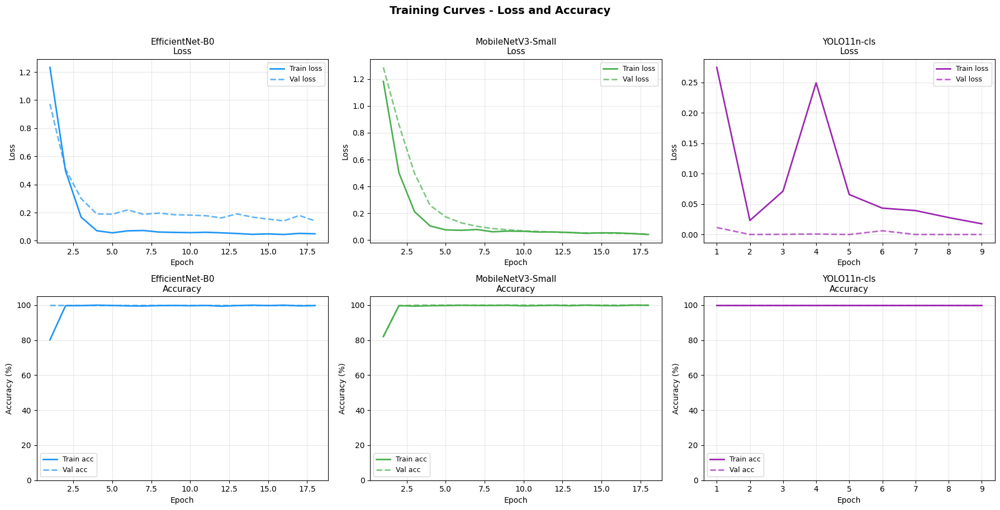

Curves saved: /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/training_curves.png


In [57]:
def plot_training_curves(histories: dict, save_path: str):
    """
    Plots accuracy and loss curves for all models.
    Each model occupies one column, rows are loss and accuracy.
    """
    model_names = list(histories.keys())
    n_models    = len(model_names)
    palette     = ['#2196F3', '#4CAF50', '#9C27B0', '#FF5722', '#FFC107']

    fig, axes = plt.subplots(2, n_models, figsize=(6 * n_models, 9))
    fig.suptitle('Training Curves - Loss and Accuracy', fontsize=14, fontweight='bold', y=1.01)

    if n_models == 1:
        axes = np.array(axes).reshape(2, 1)

    for col, (model_name, history) in enumerate(histories.items()):
        color  = palette[col % len(palette)]
        epochs = range(1, len(history.get('train_loss', [])) + 1)

        ax_loss = axes[0][col]
        ax_acc  = axes[1][col]

        if history.get('train_loss'):
            ax_loss.plot(epochs, history['train_loss'],
                         label='Train loss', color=color, linewidth=2)
            ax_loss.plot(epochs, history['val_loss'],
                         label='Val loss', color=color, linewidth=2,
                         linestyle='--', alpha=0.7)
        ax_loss.set_title(f'{model_name}\nLoss', fontsize=11)
        ax_loss.set_xlabel('Epoch')
        ax_loss.set_ylabel('Loss')
        ax_loss.legend(fontsize=9)
        ax_loss.grid(True, alpha=0.3)

        if history.get('train_acc'):
            ax_acc.plot(epochs, [a * 100 for a in history['train_acc']],
                        label='Train acc', color=color, linewidth=2)
            ax_acc.plot(epochs, [a * 100 for a in history['val_acc']],
                        label='Val acc', color=color, linewidth=2,
                        linestyle='--', alpha=0.7)
        ax_acc.set_title(f'{model_name}\nAccuracy', fontsize=11)
        ax_acc.set_xlabel('Epoch')
        ax_acc.set_ylabel('Accuracy (%)')
        ax_acc.set_ylim(0, 105)
        ax_acc.legend(fontsize=9)
        ax_acc.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Curves saved: {save_path}')


all_histories = {
    'EfficientNet-B0':   effnet_history,
    'MobileNetV3-Small': mobilenet_history,
    'YOLO11n-cls':       yolo_history
}

plot_training_curves(
    all_histories,
    save_path=os.path.join(RESULTS_DIR, 'training_curves.png')
)

# Section 15 - Confusion Matrices

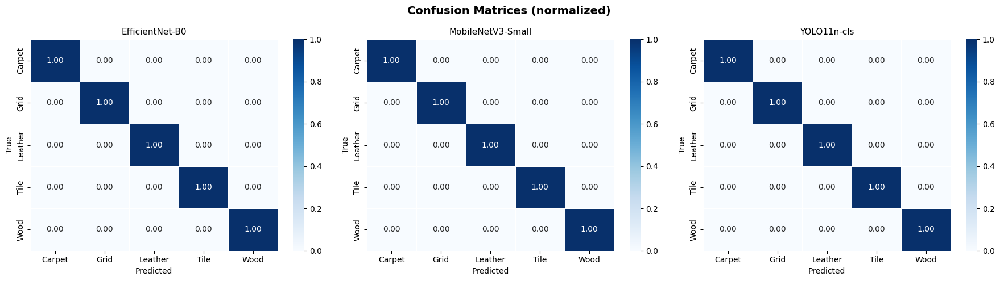

Confusion matrices saved: /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/confusion_matrices.png


In [58]:
def plot_confusion_matrices(results: list, class_names: list, save_path: str):
    """
    Plots normalized confusion matrices for all models in one row.
    'results' is a list of (model_name, preds, labels) tuples.
    """
    fig, axes = plt.subplots(1, len(results), figsize=(6 * len(results), 5))
    fig.suptitle('Confusion Matrices (normalized)', fontsize=14, fontweight='bold')

    if len(results) == 1:
        axes = [axes]

    for ax, (model_name, preds, labels) in zip(axes, results):
        known_mask = preds != -1
        p_k = preds[known_mask]
        l_k = labels[known_mask]

        cm  = confusion_matrix(l_k, p_k, labels=list(range(len(class_names))))
        cm_norm = cm.astype(float) / (cm.sum(axis=1, keepdims=True) + 1e-6)

        sns.heatmap(
            cm_norm, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=[c.capitalize() for c in class_names],
            yticklabels=[c.capitalize() for c in class_names],
            ax=ax, linewidths=0.5, vmin=0, vmax=1
        )
        ax.set_title(model_name, fontsize=11)
        ax.set_xlabel('Predicted')
        ax.set_ylabel('True')

    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Confusion matrices saved: {save_path}')


cm_results = [
    ('EfficientNet-B0',   effnet_preds,    effnet_labels),
    ('MobileNetV3-Small', mobilenet_preds, mobilenet_labels),
    ('YOLO11n-cls',       yolo_preds,      yolo_labels)
]

plot_confusion_matrices(
    cm_results, SURFACE_CLASSES,
    save_path=os.path.join(RESULTS_DIR, 'confusion_matrices.png')
)

# Section 16 - Confidence Score Distributions

## Plot Confidence Score Distributions

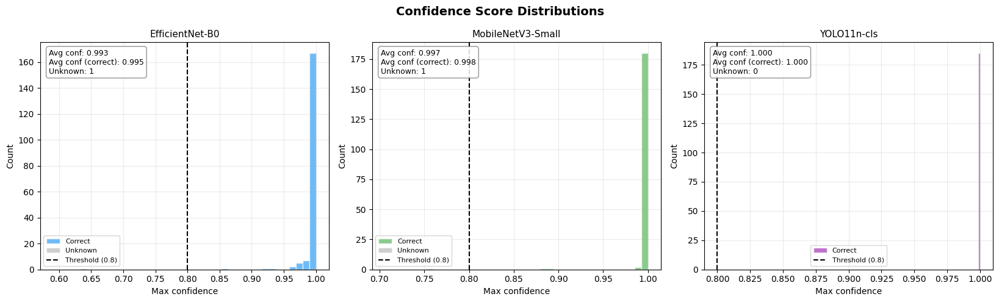

Confidence distributions saved: /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/confidence_distributions.png


In [64]:
def plot_confidence_distributions(prob_results: list,
                                  threshold: float,
                                  save_path: str):
    palette = ['#2196F3', '#4CAF50', '#9C27B0', '#FF5722', '#FFC107']
    fig, axes = plt.subplots(1, len(prob_results),
                             figsize=(5.5 * len(prob_results), 5))
    fig.suptitle('Confidence Score Distributions', fontsize=14, fontweight='bold')

    if len(prob_results) == 1:
        axes = [axes]

    for ax, (model_name, probs, preds, labels), color in zip(
            axes, prob_results, palette):

        probs_arr = np.array(probs)
        max_confs = probs_arr.max(axis=1) if probs_arr.ndim > 1 else probs_arr

        correct   = (preds == labels) & (preds != -1)
        incorrect = (preds != labels) & (preds != -1)
        unknown   = preds == -1

        avg_conf         = max_confs.mean()
        avg_conf_correct = max_confs[correct].mean() if correct.any() else 0.0
        n_unknown        = int(unknown.sum())

        x_min = max(0.0, float(max_confs.min()) - 0.05)
        x_max = 1.0
        bins  = np.linspace(x_min, x_max, 40)

        if correct.any():
            ax.hist(max_confs[correct], bins=bins, alpha=0.65, label='Correct',
                    color=color, edgecolor='white')
        if incorrect.any():
            ax.hist(max_confs[incorrect], bins=bins, alpha=0.6, label='Incorrect',
                    color='#E53935', edgecolor='white')
        if unknown.any():
            ax.hist(max_confs[unknown], bins=bins, alpha=0.5, label='Unknown',
                    color='#9E9E9E', edgecolor='white')

        ax.axvline(threshold, color='black', linestyle='--', linewidth=1.5,
                   label=f'Threshold ({threshold})')

        stats_text = (
            f'Avg conf: {avg_conf:.3f}\n'
            f'Avg conf (correct): {avg_conf_correct:.3f}\n'
            f'Unknown: {n_unknown}'
        )
        ax.text(0.03, 0.97, stats_text,
                transform=ax.transAxes,
                fontsize=9, va='top',
                bbox=dict(boxstyle='round,pad=0.35',
                          facecolor='white', alpha=0.85, edgecolor='gray'))

        ax.set_title(model_name, fontsize=11)
        ax.set_xlabel('Max confidence')
        ax.set_ylabel('Count')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.25)

    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Confidence distributions saved: {save_path}')


conf_results = [
    ('EfficientNet-B0',   effnet_probs,    effnet_preds,    effnet_labels),
    ('MobileNetV3-Small', mobilenet_probs, mobilenet_preds, mobilenet_labels),
    ('YOLO11n-cls',       yolo_probs,      yolo_preds,      yolo_labels)
]

plot_confidence_distributions(
    conf_results, CONFIDENCE_THRESHOLD,
    save_path=os.path.join(RESULTS_DIR, 'confidence_distributions.png')
)

## Inspect Unknown Predictions

In [65]:
mobilenet_probs_arr = np.array(mobilenet_probs)
unknown_mask = mobilenet_preds == -1
unknown_indices = np.where(unknown_mask)[0]

for idx in unknown_indices:
    path, _ = test_samples[idx]
    conf = mobilenet_probs_arr[idx].max()
    pred = mobilenet_probs_arr[idx].argmax()
    print(f'{path}  conf={conf:.4f}  pred={SURFACE_CLASSES[pred]}  true={SURFACE_CLASSES[mobilenet_labels[idx]]}')

/content/data/grid/train/good/023.png  conf=0.7565  pred=grid  true=grid


# Section 17 - Per-Class F1 Radar Chart

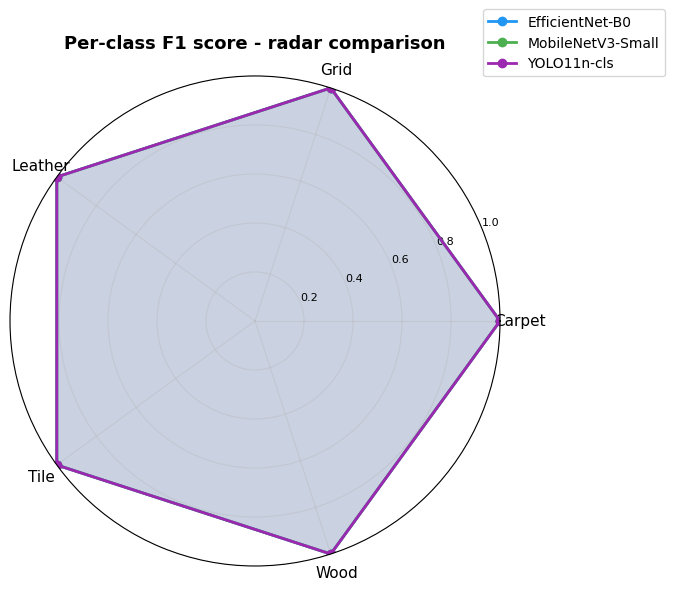

Radar chart saved: /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/per_class_f1_radar.png


In [66]:
def plot_per_class_f1_radar(metrics_dict: dict, class_names: list, save_path: str):
    """
    Radar chart showing per-class F1 scores for all models.
    Allows quick comparison of which classes each model handles best.
    """
    N      = len(class_names)
    angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    colors     = ['#2196F3', '#4CAF50', '#9C27B0', '#FF5722', '#FFC107']
    model_list = list(metrics_dict.items())

    fig, ax = plt.subplots(figsize=(7, 7), subplot_kw=dict(polar=True))

    for (model_name, metrics), color in zip(model_list, colors):
        values = [metrics['per_class_f1'].get(cls, 0) for cls in class_names]
        values += values[:1]
        ax.plot(angles, values, 'o-', linewidth=2, color=color, label=model_name)
        ax.fill(angles, values, alpha=0.12, color=color)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels([c.capitalize() for c in class_names], size=11)
    ax.set_ylim(0, 1)
    ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticklabels(['0.2', '0.4', '0.6', '0.8', '1.0'], size=8)
    ax.set_title('Per-class F1 score - radar comparison', fontsize=13,
                 fontweight='bold', pad=20)
    ax.legend(loc='upper right', bbox_to_anchor=(1.35, 1.15), fontsize=10)
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Radar chart saved: {save_path}')


all_metrics = {
    'EfficientNet-B0':   effnet_metrics,
    'MobileNetV3-Small': mobilenet_metrics,
    'YOLO11n-cls':       yolo_metrics
}

plot_per_class_f1_radar(
    all_metrics, SURFACE_CLASSES,
    save_path=os.path.join(RESULTS_DIR, 'per_class_f1_radar.png')
)

# Section 18 - Summary Metrics Table


--- Model Evaluation Summary ---
             Metric  EfficientNet-B0  MobileNetV3-Small  YOLO11n-cls
           Accuracy           1.0000             1.0000          1.0
     Top-2 Accuracy           1.0000             1.0000          1.0
         F1 (Macro)           1.0000             1.0000          1.0
      F1 (Weighted)           1.0000             1.0000          1.0
  Precision (Macro)           1.0000             1.0000          1.0
     Recall (Macro)           1.0000             1.0000          1.0
      ROC-AUC (OvR)           1.0000             1.0000          1.0
        Cohen Kappa           1.0000             1.0000          1.0
                MCC           1.0000             1.0000          1.0
           Coverage           0.9946             0.9946          1.0
Unknown Predictions           1.0000             1.0000          0.0


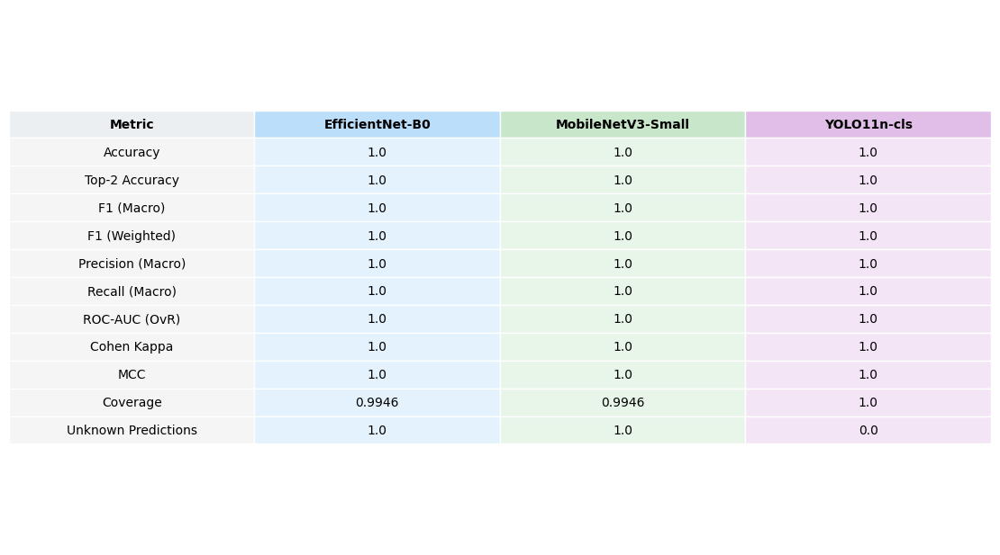

Summary table saved: /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/summary_table.png


In [67]:
def build_summary_table(metrics_dict: dict) -> pd.DataFrame:
    """
    Assembles a clean summary DataFrame comparing all models
    across all evaluation metrics.
    """
    rows = []
    metric_keys = [
        'accuracy', 'top2_accuracy', 'f1_macro', 'f1_weighted',
        'precision_macro', 'recall_macro', 'roc_auc',
        'cohen_kappa', 'mcc', 'coverage', 'n_unknown'
    ]
    display_names = [
        'Accuracy', 'Top-2 Accuracy', 'F1 (Macro)', 'F1 (Weighted)',
        'Precision (Macro)', 'Recall (Macro)', 'ROC-AUC (OvR)',
        'Cohen Kappa', 'MCC', 'Coverage', 'Unknown Predictions'
    ]

    for key, display in zip(metric_keys, display_names):
        row = {'Metric': display}
        for model_name, m in metrics_dict.items():
            val = m.get(key, 'N/A')
            row[model_name] = val
        rows.append(row)

    return pd.DataFrame(rows)


summary_df = build_summary_table(all_metrics)

print('\n--- Model Evaluation Summary ---')
print(summary_df.to_string(index=False))

summary_df.to_csv(
    os.path.join(RESULTS_DIR, 'evaluation_summary.csv'), index=False
)


def plot_summary_table(df: pd.DataFrame, save_path: str):
    model_cols = [c for c in df.columns if c != 'Metric']
    base_col_colors = ['#E3F2FD', '#E8F5E9', '#F3E5F5', '#FBE9E7', '#FFF8E1']
    base_header_colors = ['#BBDEFB', '#C8E6C9', '#E1BEE7', '#FFCCBC', '#FFECB3']

    col_colors = base_col_colors[:len(model_cols)]
    header_colors = ['#ECEFF1'] + base_header_colors[:len(model_cols)]

    n_rows = len(df)
    fig, ax = plt.subplots(figsize=(len(df.columns) * 2.8, n_rows * 0.48 + 1))
    ax.axis('off')

    cell_text = df.values.tolist()
    col_labels = df.columns.tolist()

    cell_colors = []
    for _ in range(n_rows):
        row_colors = ['#F5F5F5']
        for i in range(len(model_cols)):
            row_colors.append(col_colors[i % len(col_colors)])
        cell_colors.append(row_colors)

    tbl = ax.table(
        cellText=cell_text,
        colLabels=col_labels,
        cellLoc='center',
        loc='center'
    )

    tbl.auto_set_font_size(False)
    tbl.set_fontsize(10)
    tbl.scale(1, 1.5)

    for j in range(len(col_labels)):
        cell = tbl[(0, j)]
        cell.set_facecolor(header_colors[j])
        cell.set_text_props(weight='bold')
        cell.set_edgecolor('white')

    for i in range(1, n_rows + 1):
        for j in range(len(col_labels)):
            cell = tbl[(i, j)]
            cell.set_facecolor(cell_colors[i - 1][j])
            cell.set_edgecolor('white')

    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Summary table saved: {save_path}')


plot_summary_table(
    summary_df,
    save_path=os.path.join(RESULTS_DIR, 'summary_table.png')
)

# Section 19 - Parameters

## Install torchinfo

In [68]:
!pip install torchinfo -q

## Model Parameter Summary and Inference Speed

Profiles each model for total/trainable parameter counts, on-disk size, and per-image inference latency.


--- Model Profile Summary ---
  Model                        Params  Size (MB)  Mean (ms)  Min (ms)  Max (ms)
  ------------------------------------------------------------------------------
  EfficientNet-B0           4,336,769      16.83      9.208     8.825    11.451
  MobileNetV3-Small         1,076,005       4.23       6.21      5.83    11.751
  YOLO11n-cls               1,537,509       5.98      6.281     5.803     9.504


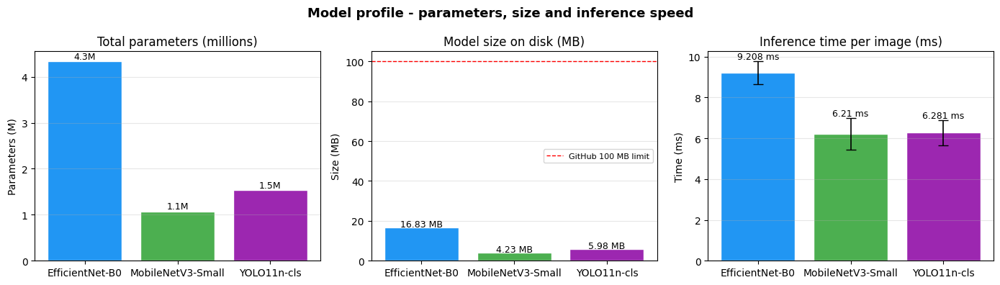

Model profile saved: /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/model_profile.png


In [69]:
# Section - Model Parameter Summary and Inference Speed

import time
from torchinfo import summary as ti_summary

def get_model_size_mb(model: nn.Module) -> float:
    tmp_path = '/tmp/tmp_model_size.pt'
    torch.save(model.state_dict(), tmp_path)
    size_mb = os.path.getsize(tmp_path) / (1024 * 1024)
    os.remove(tmp_path)
    return round(size_mb, 2)


def measure_inference_time(model: nn.Module, device: torch.device,
                           img_size: int = 224, n_runs: int = 200) -> dict:
    model.eval()
    dummy = torch.randn(1, 3, img_size, img_size).to(device)

    with torch.no_grad():
        for _ in range(20):
            _ = model(dummy)

    times = []
    with torch.no_grad():
        for _ in range(n_runs):
            if device.type == 'cuda':
                torch.cuda.synchronize()
            t0 = time.perf_counter()
            _ = model(dummy)
            if device.type == 'cuda':
                torch.cuda.synchronize()
            times.append((time.perf_counter() - t0) * 1000)

    return {
        'mean_ms':   round(float(np.mean(times)), 3),
        'std_ms':    round(float(np.std(times)),  3),
        'min_ms':    round(float(np.min(times)),  3),
        'max_ms':    round(float(np.max(times)),  3),
    }


def count_params(model: nn.Module) -> dict:
    total     = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return {'total': total, 'trainable': trainable, 'frozen': total - trainable}


def build_model_profile_table(model_entries: list, device: torch.device) -> pd.DataFrame:
    rows = []
    for model_name, model in model_entries:
        params  = count_params(model)
        size_mb = get_model_size_mb(model)
        timing  = measure_inference_time(model, device)

        rows.append({
            'Model':               model_name,
            'Total params':        f'{params["total"]:,}',
            'Trainable params':    f'{params["trainable"]:,}',
            'Frozen params':       f'{params["frozen"]:,}',
            'Size on disk (MB)':   size_mb,
            'Inference mean (ms)': timing['mean_ms'],
            'Inference std (ms)':  timing['std_ms'],
            'Inference min (ms)':  timing['min_ms'],
            'Inference max (ms)':  timing['max_ms'],
        })

    return pd.DataFrame(rows)


def plot_model_profile(df: pd.DataFrame, save_path: str):
    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    fig.suptitle('Model profile - parameters, size and inference speed',
                 fontsize=13, fontweight='bold')

    colors = ['#2196F3', '#4CAF50', '#9C27B0', '#FF5722', '#FFC107']
    models = df['Model'].tolist()

    total_params = [int(v.replace(',', '')) for v in df['Total params']]
    plot_colors = colors[:len(models)]

    axes[0].bar(models, [p / 1e6 for p in total_params], color=plot_colors, edgecolor='white')
    axes[0].set_title('Total parameters (millions)')
    axes[0].set_ylabel('Parameters (M)')
    for i, v in enumerate(total_params):
        axes[0].text(i, v / 1e6 + 0.05, f'{v/1e6:.1f}M', ha='center', fontsize=9)
    axes[0].grid(True, alpha=0.3, axis='y')

    sizes = df['Size on disk (MB)'].tolist()
    axes[1].bar(models, sizes, color=plot_colors, edgecolor='white')
    axes[1].set_title('Model size on disk (MB)')
    axes[1].set_ylabel('Size (MB)')
    for i, v in enumerate(sizes):
        axes[1].text(i, v + 0.2, f'{v} MB', ha='center', fontsize=9)
    axes[1].axhline(100, color='red', linestyle='--', linewidth=1,
                    label='GitHub 100 MB limit')
    axes[1].legend(fontsize=8)
    axes[1].grid(True, alpha=0.3, axis='y')

    means = df['Inference mean (ms)'].tolist()
    stds  = df['Inference std (ms)'].tolist()
    axes[2].bar(models, means, yerr=stds, color=plot_colors, edgecolor='white',
                capsize=5, error_kw={'linewidth': 1.2})
    axes[2].set_title('Inference time per image (ms)')
    axes[2].set_ylabel('Time (ms)')
    for i, v in enumerate(means):
        axes[2].text(i, v + stds[i] + 0.1, f'{v} ms', ha='center', fontsize=9)
    axes[2].grid(True, alpha=0.3, axis='y')

    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Model profile saved: {save_path}')


def print_model_profile_table(df: pd.DataFrame):
    print('\n--- Model Profile Summary ---')
    print(f'  {"Model":<22} {"Params":>12} {"Size (MB)":>10} {"Mean (ms)":>10} {"Min (ms)":>9} {"Max (ms)":>9}')
    print('  ' + '-' * 78)
    for _, row in df.iterrows():
        print(f'  {row["Model"]:<22} {row["Total params"]:>12} '
              f'{row["Size on disk (MB)"]:>10} '
              f'{row["Inference mean (ms)"]:>10} '
              f'{row["Inference min (ms)"]:>9} '
              f'{row["Inference max (ms)"]:>9}')


model_entries = [
    ('EfficientNet-B0',   effnet_model),
    ('MobileNetV3-Small', mobilenet_model),
    ('YOLO11n-cls',       yolo_model.model.to(DEVICE) if hasattr(yolo_model, 'model') else effnet_model),
]

profile_df = build_model_profile_table(model_entries, DEVICE)

print_model_profile_table(profile_df)

plot_model_profile(
    profile_df,
    save_path=os.path.join(RESULTS_DIR, 'model_profile.png')
)

profile_df.to_csv(os.path.join(RESULTS_DIR, 'model_profile.csv'), index=False)

# Section 23 - Energy-Based and Combined Rejection

Defines energy-score thresholds and combined energy-plus-embedding rejection utilities for improved out-of-distribution detection.

In [104]:
import numpy as np
import torch
import torch.nn.functional as F
from collections import defaultdict

ENERGY_TEMPERATURE  = 1.0
ENERGY_QUANTILE     = 0.995
EMBEDDING_QUANTILE  = 0.999
COMBINED_ENERGY_Q   = 0.995
COMBINED_EMBED_Q    = 0.995


def compute_energy(logits: torch.Tensor, T: float = ENERGY_TEMPERATURE) -> np.ndarray:
    """
    Compute energy scores from model logits.

    Lower / more negative energy usually indicates the sample looks more like
    the known training distribution, while higher energy indicates more uncertainty.
    """
    return (-T * torch.logsumexp(logits / T, dim=1)).cpu().numpy()


def fit_energy_threshold(model, train_loader,
                         quantile: float = ENERGY_QUANTILE,
                         T: float = ENERGY_TEMPERATURE,
                         device: torch.device = DEVICE) -> dict:
    """
    Fit per-class and global energy thresholds using known-class training samples.
    """
    model.eval()
    energies_by_class = defaultdict(list)
    all_energies = []

    with torch.no_grad():
        for images, labels in train_loader:
            images = images.to(device)
            logits = model(images)
            energies = compute_energy(logits, T)

            for i, lbl in enumerate(labels):
                energies_by_class[lbl.item()].append(energies[i])

            all_energies.extend(energies.tolist())

    per_class_thresh = {}
    for cls, vals in energies_by_class.items():
        per_class_thresh[cls] = float(np.quantile(vals, quantile))
        print(
            f'  {SURFACE_CLASSES[cls]:10s} - '
            f'energy threshold @ q{quantile:.1%}: {per_class_thresh[cls]:.4f}'
        )

    global_thresh = float(np.quantile(all_energies, quantile))
    print(f'  {"GLOBAL":10s} - energy threshold @ q{quantile:.1%}: {global_thresh:.4f}')

    return {
        'global_threshold': global_thresh,
        'per_class': per_class_thresh,
        'all_energies': np.array(all_energies),
    }


def _extract_features(model, images, model_type: str = 'mobilenet'):
    """
    Extract backbone embeddings before the final classifier layer.

    For EfficientNet, assumes features are exposed through model.base(images).
    For MobileNet-style models, uses features -> avgpool -> flatten.
    """
    if model_type == 'efficientnet':
        feats = model.base(images)
    else:
        feats = model.features(images)
        feats = model.avgpool(feats)
        feats = torch.flatten(feats, 1)

    return feats


def _l2_normalize_np(x: np.ndarray, eps: float = 1e-12) -> np.ndarray:
    """
    L2-normalize numpy feature vectors row-wise.
    """
    norm = np.linalg.norm(x, axis=1, keepdims=True)
    return x / np.clip(norm, eps, None)


def _mahalanobis_batch(embs: np.ndarray,
                       centroid: np.ndarray,
                       inv_cov: np.ndarray) -> np.ndarray:
    """
    Compute Mahalanobis distance for a batch of embeddings against one class model.
    """
    diffs = embs - centroid
    return np.sqrt(np.einsum('bi,ij,bj->b', diffs, inv_cov, diffs))


def fit_embedding_gate(model, train_loader,
                       quantile: float = EMBEDDING_QUANTILE,
                       model_type: str = 'mobilenet',
                       device: torch.device = DEVICE,
                       reg: float = 1e-4,
                       val_loader=None) -> dict:
    """
    Fit an embedding-based rejection gate using:
    1. L2-normalized embeddings
    2. Class centroids
    3. Per-class Mahalanobis distance thresholds

    Design:
    - Train loader is used to estimate centroids and covariance structure.
    - Validation loader, if provided, is used only to calibrate thresholds.
      This is cleaner than calibrating thresholds on train embeddings.
    """
    model.eval()

    # ============================================================
    # 1. Build class statistics from TRAIN embeddings
    # ============================================================
    train_embeddings_by_class = defaultdict(list)

    with torch.no_grad():
        for images, labels in train_loader:
            images = images.to(device)

            feats = _extract_features(model, images, model_type)
            feats = F.normalize(feats, p=2, dim=1)   # L2 normalization in feature space

            feats_np = feats.cpu().numpy()

            for i, lbl in enumerate(labels):
                train_embeddings_by_class[lbl.item()].append(feats_np[i])

    centroids = {}
    inv_covs = {}

    for cls, embs in train_embeddings_by_class.items():
        embs = np.stack(embs)

        # Compute class centroid and normalize it as well
        centroid = embs.mean(axis=0, keepdims=True)
        centroid = _l2_normalize_np(centroid)[0]

        # Estimate covariance in normalized embedding space
        centered = embs - centroid
        cov = np.cov(centered, rowvar=False)

        # Regularization makes covariance inversion more stable
        cov = cov + reg * np.eye(cov.shape[0], dtype=cov.dtype)
        inv_cov = np.linalg.pinv(cov)

        centroids[cls] = centroid
        inv_covs[cls] = inv_cov

    # ============================================================
    # 2. Calibrate thresholds
    #    Prefer validation loader if provided
    # ============================================================
    threshold_loader = val_loader if val_loader is not None else train_loader
    threshold_embeddings_by_class = defaultdict(list)

    with torch.no_grad():
        for images, labels in threshold_loader:
            images = images.to(device)

            feats = _extract_features(model, images, model_type)
            feats = F.normalize(feats, p=2, dim=1)

            feats_np = feats.cpu().numpy()

            for i, lbl in enumerate(labels):
                threshold_embeddings_by_class[lbl.item()].append(feats_np[i])

    thresholds = {}
    source_name = "val" if val_loader is not None else "train"

    for cls, embs in threshold_embeddings_by_class.items():
        embs = np.stack(embs)

        dists = _mahalanobis_batch(
            embs=embs,
            centroid=centroids[cls],
            inv_cov=inv_covs[cls]
        )

        thresholds[cls] = float(np.quantile(dists, quantile))

        print(
            f'  {SURFACE_CLASSES[cls]:10s} - '
            f'mahalanobis threshold from {source_name} @ q{quantile:.1%}: '
            f'{thresholds[cls]:.4f}'
        )

    return {
        'centroids': centroids,
        'inv_covs': inv_covs,
        'thresholds': thresholds
    }


def get_embedding(model, img_tensor, model_type: str = 'mobilenet'):
    """
    Extract one normalized embedding for inference-time rejection.
    """
    with torch.no_grad():
        feats = _extract_features(model, img_tensor, model_type)
        feats = F.normalize(feats, p=2, dim=1)

    return feats.cpu().numpy().flatten()


def mahalanobis_distance(feat: np.ndarray,
                         centroid: np.ndarray,
                         inv_cov: np.ndarray) -> float:
    """
    Compute Mahalanobis distance between one feature vector and one class centroid.
    """
    diff = feat - centroid
    return float(np.sqrt(diff @ inv_cov @ diff))


def embedding_reject(feat: np.ndarray, embed_info: dict) -> bool:
    """
    Reject a sample if its nearest class Mahalanobis distance exceeds that class threshold.
    """
    min_dist = float('inf')
    nearest = None

    for cls, centroid in embed_info['centroids'].items():
        inv_cov = embed_info['inv_covs'][cls]
        dist = mahalanobis_distance(feat, centroid, inv_cov)

        if dist < min_dist:
            min_dist = dist
            nearest = cls

    return min_dist > embed_info['thresholds'][nearest]


def energy_predict(model, loader,
                   energy_info: dict,
                   T: float = ENERGY_TEMPERATURE,
                   device: torch.device = DEVICE):
    """
    Predict with energy-based rejection.

    Returns:
    - energies
    - predictions (-1 means rejected / unknown)
    - true labels
    """
    model.eval()
    all_energies = []
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            logits = model(images)

            energies = compute_energy(logits, T)
            preds = torch.softmax(logits, dim=1).argmax(dim=1).cpu().numpy()

            for i in range(len(preds)):
                thresh = energy_info['per_class'][preds[i]]
                all_preds.append(-1 if energies[i] > thresh else int(preds[i]))
                all_energies.append(float(energies[i]))

            all_labels.extend(labels.tolist())

    return np.array(all_energies), np.array(all_preds), np.array(all_labels)


def save_energy_info(energy_info: dict, path: str):
    """
    Save energy thresholds to JSON.
    """
    import json

    serialisable = {
        'global_threshold': energy_info['global_threshold'],
        'per_class': {str(k): float(v) for k, v in energy_info['per_class'].items()},
    }

    with open(path, 'w') as f:
        json.dump(serialisable, f, indent=2)

    print(f'Energy thresholds saved -> {path}')


def load_energy_info(path: str) -> dict:
    """
    Load energy thresholds from JSON.
    """
    import json

    with open(path) as f:
        raw = json.load(f)

    return {
        'global_threshold': raw['global_threshold'],
        'per_class': {int(k): float(v) for k, v in raw['per_class'].items()},
    }


print('Energy + normalized Mahalanobis embedding rejection utilities loaded.')

Energy + normalized Mahalanobis embedding rejection utilities loaded.


## Fit Energy and Embedding Thresholds - EfficientNet-B0

In [105]:
print('Fitting energy thresholds - EfficientNet-B0 ...')
effnet_energy_info = fit_energy_threshold(
    model        = effnet_model,
    train_loader = train_loader,
    quantile     = ENERGY_QUANTILE,
    T            = ENERGY_TEMPERATURE,
    device       = DEVICE,
)
save_energy_info(effnet_energy_info, os.path.join(RESULTS_DIR, 'effnet_energy_thresholds.json'))

print('\nFitting embedding gate - EfficientNet-B0 ...')
effnet_embed_info = fit_embedding_gate(
    model        = effnet_model,
    train_loader = train_loader,
    val_loader   = val_loader,
    quantile     = EMBEDDING_QUANTILE,
    model_type   = 'efficientnet',
    device       = DEVICE,
)

print('\nFitting combined thresholds - EfficientNet-B0 ...')
effnet_energy_info_comb = fit_energy_threshold(
    model        = effnet_model,
    train_loader = train_loader,
    quantile     = COMBINED_ENERGY_Q,
    T            = ENERGY_TEMPERATURE,
    device       = DEVICE,
)
effnet_embed_info_comb = fit_embedding_gate(
    model        = effnet_model,
    train_loader = train_loader,
    val_loader   = val_loader,
    quantile     = COMBINED_EMBED_Q,
    model_type   = 'efficientnet',
    device       = DEVICE,
)

effnet_energies, effnet_energy_preds, effnet_energy_labels = energy_predict(
    effnet_model, test_loader, effnet_energy_info
)

total   = len(effnet_energy_labels)
n_rej   = (effnet_energy_preds == -1).sum()
n_acc   = total - n_rej
acc_acc = accuracy_score(
    effnet_energy_labels[effnet_energy_preds != -1],
    effnet_energy_preds[effnet_energy_preds  != -1]
) if n_acc > 0 else 0.0

print(f'\nEfficientNet-B0  |  test set ({total} samples)')
print(f'  Accepted : {n_acc}  ({n_acc/total*100:.1f}%)')
print(f'  Rejected : {n_rej}  ({n_rej/total*100:.1f}%)')
print(f'  Accuracy on accepted : {acc_acc:.4f}')

Fitting energy thresholds - EfficientNet-B0 ...
  carpet     - energy threshold @ q99.5%: -4.6546
  grid       - energy threshold @ q99.5%: -3.4996
  wood       - energy threshold @ q99.5%: -4.3430
  tile       - energy threshold @ q99.5%: -4.2479
  leather    - energy threshold @ q99.5%: -3.2951
  GLOBAL     - energy threshold @ q99.5%: -3.7266
Energy thresholds saved -> /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/effnet_energy_thresholds.json

Fitting embedding gate - EfficientNet-B0 ...
  carpet     - mahalanobis threshold from val @ q99.9%: 56.9838
  tile       - mahalanobis threshold from val @ q99.9%: 77.6745
  leather    - mahalanobis threshold from val @ q99.9%: 63.3123
  grid       - mahalanobis threshold from val @ q99.9%: 79.7520
  wood       - mahalanobis threshold from val @ q99.9%: 76.9140

Fitting combined thresholds - EfficientNet-B0 ...
  tile       - energy threshold @ q99.5%: -4.9034
  leather    - energy threshold @ q99.5%: -3.6955
  wood     

## Fit Energy and Embedding Thresholds - MobileNetV3-Small

In [106]:
print('Fitting energy thresholds - MobileNetV3-Small ...')
mobilenet_energy_info = fit_energy_threshold(
    model        = mobilenet_model,
    train_loader = train_loader,
    quantile     = ENERGY_QUANTILE,
    T            = ENERGY_TEMPERATURE,
    device       = DEVICE,
)
save_energy_info(mobilenet_energy_info, os.path.join(RESULTS_DIR, 'mobilenet_energy_thresholds.json'))

print('\nFitting embedding gate - MobileNetV3-Small ...')
mobilenet_embed_info = fit_embedding_gate(
    model        = mobilenet_model,
    train_loader = train_loader,
    val_loader   = val_loader,
    quantile     = EMBEDDING_QUANTILE,
    model_type   = 'mobilenet',
    device       = DEVICE,
)

print('\nFitting combined thresholds - MobileNetV3-Small ...')
mobilenet_energy_info_comb = fit_energy_threshold(
    model        = mobilenet_model,
    train_loader = train_loader,
    quantile     = COMBINED_ENERGY_Q,
    T            = ENERGY_TEMPERATURE,
    device       = DEVICE,
)
mobilenet_embed_info_comb = fit_embedding_gate(
    model        = mobilenet_model,
    train_loader = train_loader,
    val_loader   = val_loader,
    quantile     = COMBINED_EMBED_Q,
    model_type   = 'mobilenet',
    device       = DEVICE,
)

mobilenet_energies, mobilenet_energy_preds, mobilenet_energy_labels = energy_predict(
    mobilenet_model, test_loader, mobilenet_energy_info
)

total   = len(mobilenet_energy_labels)
n_rej   = (mobilenet_energy_preds == -1).sum()
n_acc   = total - n_rej
acc_acc = accuracy_score(
    mobilenet_energy_labels[mobilenet_energy_preds != -1],
    mobilenet_energy_preds[mobilenet_energy_preds  != -1]
) if n_acc > 0 else 0.0

print(f'\nMobileNetV3-Small  |  test set ({total} samples)')
print(f'  Accepted : {n_acc}  ({n_acc/total*100:.1f}%)')
print(f'  Rejected : {n_rej}  ({n_rej/total*100:.1f}%)')
print(f'  Accuracy on accepted : {acc_acc:.4f}')

Fitting energy thresholds - MobileNetV3-Small ...
  grid       - energy threshold @ q99.5%: -6.2273
  leather    - energy threshold @ q99.5%: -6.3976
  wood       - energy threshold @ q99.5%: -5.9808
  carpet     - energy threshold @ q99.5%: -6.1016
  tile       - energy threshold @ q99.5%: -4.7060
  GLOBAL     - energy threshold @ q99.5%: -5.3510
Energy thresholds saved -> /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/mobilenet_energy_thresholds.json

Fitting embedding gate - MobileNetV3-Small ...
  carpet     - mahalanobis threshold from val @ q99.9%: 44.3414
  tile       - mahalanobis threshold from val @ q99.9%: 31.5299
  leather    - mahalanobis threshold from val @ q99.9%: 31.2007
  grid       - mahalanobis threshold from val @ q99.9%: 51.8462
  wood       - mahalanobis threshold from val @ q99.9%: 36.4452

Fitting combined thresholds - MobileNetV3-Small ...
  tile       - energy threshold @ q99.5%: -5.6539
  wood       - energy threshold @ q99.5%: -5.7421
  

## Per-Class Rejection Rate Analysis

Breaks down acceptance and rejection counts per class for each gate strategy, allowing direct comparison of energy, embedding, and combined approaches.

In [107]:
def per_class_rejection_rate(preds, labels, class_names):
    rows = []
    for cls_idx, cls_name in enumerate(class_names):
        mask      = labels == cls_idx
        total_cls = mask.sum()
        if total_cls == 0:
            continue
        rejected = (preds[mask] == -1).sum()
        accepted = total_cls - rejected
        correct  = (preds[mask] == cls_idx).sum()
        rows.append({
            'Class'      : cls_name,
            'Total'      : int(total_cls),
            'Accepted'   : int(accepted),
            'Rejected'   : int(rejected),
            'Reject %'   : round(rejected / total_cls * 100, 1),
            'Correct'    : int(correct),
            'Acc (acc.)' : round(correct / accepted * 100, 1) if accepted > 0 else 0.0,
        })
    df = pd.DataFrame(rows)
    summary = {
        'Class'      : 'TOTAL',
        'Total'      : df['Total'].sum(),
        'Accepted'   : df['Accepted'].sum(),
        'Rejected'   : df['Rejected'].sum(),
        'Reject %'   : round(df['Rejected'].sum() / df['Total'].sum() * 100, 1),
        'Correct'    : df['Correct'].sum(),
        'Acc (acc.)' : round(df['Correct'].sum() / df['Accepted'].sum() * 100, 1)
                       if df['Accepted'].sum() > 0 else 0.0,
    }
    df = pd.concat([df, pd.DataFrame([summary])], ignore_index=True)
    return df


def compute_embedding_preds(model, loader, embed_info, model_type, device=DEVICE):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            if model_type == 'efficientnet':
                feats = model.base(images)
            else:
                feats = model.features(images)
                feats = model.avgpool(feats)
                feats = torch.flatten(feats, 1)
            feats = feats.cpu().numpy()
            for i, lbl in enumerate(labels):
                feat     = feats[i]
                min_dist, nearest = float('inf'), None
                for cls, centroid in embed_info['centroids'].items():
                    d = np.linalg.norm(feat - centroid)
                    if d < min_dist:
                        min_dist, nearest = d, cls
                if min_dist > embed_info['thresholds'][nearest]:
                    all_preds.append(-1)
                else:
                    all_preds.append(nearest)
                all_labels.append(lbl.item())
    return np.array(all_preds), np.array(all_labels)


def compute_combined_preds(model, loader, energy_info, embed_info, model_type, device=DEVICE):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            logits = model(images)
            e      = compute_energy(logits, ENERGY_TEMPERATURE)
            preds  = torch.softmax(logits, dim=1).argmax(dim=1).cpu().numpy()

            if model_type == 'efficientnet':
                feats = model.base(images)
            else:
                feats = model.features(images)
                feats = model.avgpool(feats)
                feats = torch.flatten(feats, 1)
            feats = feats.cpu().numpy()

            for i, lbl in enumerate(labels):
                pred_cls   = preds[i]
                energy_rej = e[i] > energy_info['per_class'][pred_cls]

                feat     = feats[i]
                min_dist, nearest = float('inf'), None
                for cls, centroid in embed_info['centroids'].items():
                    d = np.linalg.norm(feat - centroid)
                    if d < min_dist:
                        min_dist, nearest = d, cls
                embed_rej = min_dist > embed_info['thresholds'][nearest]

                if energy_rej or embed_rej:
                    all_preds.append(-1)
                else:
                    all_preds.append(int(pred_cls))
                all_labels.append(lbl.item())
    return np.array(all_preds), np.array(all_labels)


effnet_embed_preds,    effnet_embed_labels    = compute_embedding_preds(
    effnet_model, test_loader, effnet_embed_info, 'efficientnet'
)
effnet_combined_preds, effnet_combined_labels = compute_combined_preds(
    effnet_model, test_loader, effnet_energy_info_comb, effnet_embed_info_comb, 'efficientnet'
)

mobilenet_embed_preds,    mobilenet_embed_labels    = compute_embedding_preds(
    mobilenet_model, test_loader, mobilenet_embed_info, 'mobilenet'
)
mobilenet_combined_preds, mobilenet_combined_labels = compute_combined_preds(
    mobilenet_model, test_loader, mobilenet_energy_info_comb, mobilenet_embed_info_comb, 'mobilenet'
)

for model_name, sets in [
    ('EfficientNet-B0', [
        ('Energy',    effnet_energy_preds,   effnet_energy_labels),
        ('Embedding', effnet_embed_preds,    effnet_embed_labels),
        ('Combined',  effnet_combined_preds, effnet_combined_labels),
    ]),
    ('MobileNetV3-Small', [
        ('Energy',    mobilenet_energy_preds,   mobilenet_energy_labels),
        ('Embedding', mobilenet_embed_preds,    mobilenet_embed_labels),
        ('Combined',  mobilenet_combined_preds, mobilenet_combined_labels),
    ]),
]:
    print(f'\n{"=" * 60}')
    print(f'{model_name}  -  Per-Class Rejection Rate Comparison')
    print(f'{"=" * 60}')
    for gate_name, preds, labels in sets:
        print(f'\n  -- {gate_name} gate --')
        display(per_class_rejection_rate(preds, labels, SURFACE_CLASSES))


EfficientNet-B0  -  Per-Class Rejection Rate Comparison

  -- Energy gate --


,Class,Total,Accepted,Rejected,Reject %,Correct,Acc (acc.)
0,carpet,42,30,12,28.6,30,100.0
1,grid,40,37,3,7.5,37,100.0
2,leather,37,37,0,0.0,37,100.0
3,tile,31,31,0,0.0,31,100.0
4,wood,35,34,1,2.9,34,100.0
5,TOTAL,185,169,16,8.6,169,100.0



  -- Embedding gate --


,Class,Total,Accepted,Rejected,Reject %,Correct,Acc (acc.)
0,carpet,42,42,0,0.0,42,100.0
1,grid,40,40,0,0.0,40,100.0
2,leather,37,37,0,0.0,37,100.0
3,tile,31,31,0,0.0,31,100.0
4,wood,35,35,0,0.0,35,100.0
5,TOTAL,185,185,0,0.0,185,100.0



  -- Combined gate --


,Class,Total,Accepted,Rejected,Reject %,Correct,Acc (acc.)
0,carpet,42,35,7,16.7,35,100.0
1,grid,40,36,4,10.0,36,100.0
2,leather,37,36,1,2.7,36,100.0
3,tile,31,29,2,6.5,29,100.0
4,wood,35,32,3,8.6,32,100.0
5,TOTAL,185,168,17,9.2,168,100.0



MobileNetV3-Small  -  Per-Class Rejection Rate Comparison

  -- Energy gate --


,Class,Total,Accepted,Rejected,Reject %,Correct,Acc (acc.)
0,carpet,42,40,2,4.8,40,100.0
1,grid,40,34,6,15.0,34,100.0
2,leather,37,37,0,0.0,37,100.0
3,tile,31,31,0,0.0,31,100.0
4,wood,35,35,0,0.0,35,100.0
5,TOTAL,185,177,8,4.3,177,100.0



  -- Embedding gate --


,Class,Total,Accepted,Rejected,Reject %,Correct,Acc (acc.)
0,carpet,42,42,0,0.0,42,100.0
1,grid,40,40,0,0.0,40,100.0
2,leather,37,37,0,0.0,37,100.0
3,tile,31,31,0,0.0,31,100.0
4,wood,35,35,0,0.0,35,100.0
5,TOTAL,185,185,0,0.0,185,100.0



  -- Combined gate --


,Class,Total,Accepted,Rejected,Reject %,Correct,Acc (acc.)
0,carpet,42,42,0,0.0,42,100.0
1,grid,40,37,3,7.5,37,100.0
2,leather,37,37,0,0.0,37,100.0
3,tile,31,31,0,0.0,31,100.0
4,wood,35,35,0,0.0,35,100.0
5,TOTAL,185,182,3,1.6,182,100.0


## Full OOD Evaluation with All Gate Strategies

Runs all rejection strategies (plain, energy, embedding, combined) against external OOD samples and reports classification vs. rejection rates.

In [108]:
def run_energy_evaluation(samples: list,
                          effnet_energy_info:         dict,
                          effnet_embed_info:          dict,
                          effnet_energy_info_comb:    dict,
                          effnet_embed_info_comb:     dict,
                          mobilenet_energy_info:      dict,
                          mobilenet_embed_info:       dict,
                          mobilenet_energy_info_comb: dict,
                          mobilenet_embed_info_comb:  dict):
    results = {
        'EfficientNet-B0 (plain)'       : {'classified': 0, 'unknown': 0, 'rejected': 0},
        'EfficientNet-B0 (energy)'      : {'classified': 0, 'unknown': 0, 'rejected': 0},
        'EfficientNet-B0 (embedding)'   : {'classified': 0, 'unknown': 0, 'rejected': 0},
        'EfficientNet-B0 (combined)'    : {'classified': 0, 'unknown': 0, 'rejected': 0},
        'MobileNetV3-Small (plain)'     : {'classified': 0, 'unknown': 0, 'rejected': 0},
        'MobileNetV3-Small (energy)'    : {'classified': 0, 'unknown': 0, 'rejected': 0},
        'MobileNetV3-Small (embedding)' : {'classified': 0, 'unknown': 0, 'rejected': 0},
        'MobileNetV3-Small (combined)'  : {'classified': 0, 'unknown': 0, 'rejected': 0},
        'YOLO11n-cls'                   : {'classified': 0, 'unknown': 0, 'rejected': 0},
    }

    for entry in samples:
        img        = Image.open(entry['path']).convert('RGB')
        img_tensor = VAL_TRANSFORMS(img).unsqueeze(0).to(DEVICE)

        effnet_model.eval()
        with torch.no_grad():
            logits_eff = effnet_model(img_tensor)
        probs_eff  = torch.softmax(logits_eff, dim=1).cpu().numpy().flatten()
        conf_eff   = probs_eff.max()
        pred_eff   = int(probs_eff.argmax())
        e_eff      = float(compute_energy(logits_eff, ENERGY_TEMPERATURE)[0])
        feat_eff   = get_embedding(effnet_model, img_tensor, 'efficientnet')

        if conf_eff >= CONFIDENCE_THRESHOLD:
            results['EfficientNet-B0 (plain)']['classified'] += 1
        else:
            results['EfficientNet-B0 (plain)']['unknown'] += 1

        if e_eff > effnet_energy_info['per_class'][pred_eff]:
            results['EfficientNet-B0 (energy)']['rejected'] += 1
        else:
            results['EfficientNet-B0 (energy)']['classified'] += 1

        if embedding_reject(feat_eff, effnet_embed_info):
            results['EfficientNet-B0 (embedding)']['rejected'] += 1
        else:
            results['EfficientNet-B0 (embedding)']['classified'] += 1

        energy_rej_comb = e_eff > effnet_energy_info_comb['per_class'][pred_eff]
        embed_rej_comb  = embedding_reject(feat_eff, effnet_embed_info_comb)
        if energy_rej_comb or embed_rej_comb:
            results['EfficientNet-B0 (combined)']['rejected'] += 1
        else:
            results['EfficientNet-B0 (combined)']['classified'] += 1

        mobilenet_model.eval()
        with torch.no_grad():
            logits_mob = mobilenet_model(img_tensor)
        probs_mob  = torch.softmax(logits_mob, dim=1).cpu().numpy().flatten()
        conf_mob   = probs_mob.max()
        pred_mob   = int(probs_mob.argmax())
        e_mob      = float(compute_energy(logits_mob, ENERGY_TEMPERATURE)[0])
        feat_mob   = get_embedding(mobilenet_model, img_tensor, 'mobilenet')

        if conf_mob >= CONFIDENCE_THRESHOLD:
            results['MobileNetV3-Small (plain)']['classified'] += 1
        else:
            results['MobileNetV3-Small (plain)']['unknown'] += 1

        if e_mob > mobilenet_energy_info['per_class'][pred_mob]:
            results['MobileNetV3-Small (energy)']['rejected'] += 1
        else:
            results['MobileNetV3-Small (energy)']['classified'] += 1

        if embedding_reject(feat_mob, mobilenet_embed_info):
            results['MobileNetV3-Small (embedding)']['rejected'] += 1
        else:
            results['MobileNetV3-Small (embedding)']['classified'] += 1

        energy_rej_comb = e_mob > mobilenet_energy_info_comb['per_class'][pred_mob]
        embed_rej_comb  = embedding_reject(feat_mob, mobilenet_embed_info_comb)
        if energy_rej_comb or embed_rej_comb:
            results['MobileNetV3-Small (combined)']['rejected'] += 1
        else:
            results['MobileNetV3-Small (combined)']['classified'] += 1

        img_resized = img.resize((IMG_SIZE, IMG_SIZE))
        yolo_result = yolo_model(img_resized, verbose=False)[0]
        yolo_probs  = yolo_result.probs.data.cpu().numpy().flatten()
        yolo_conf   = float(yolo_probs.max())
        if yolo_conf >= CONFIDENCE_THRESHOLD:
            results['YOLO11n-cls']['classified'] += 1
        else:
            results['YOLO11n-cls']['unknown'] += 1

    total = len(samples)

    groups = [
        ('EfficientNet-B0', [
            'EfficientNet-B0 (plain)',
            'EfficientNet-B0 (energy)',
            'EfficientNet-B0 (embedding)',
            'EfficientNet-B0 (combined)',
        ]),
        ('MobileNetV3-Small', [
            'MobileNetV3-Small (plain)',
            'MobileNetV3-Small (energy)',
            'MobileNetV3-Small (embedding)',
            'MobileNetV3-Small (combined)',
        ]),
        ('YOLO11n-cls', [
            'YOLO11n-cls',
        ]),
    ]

    print(f'\nOOD Evaluation on {total} external samples')
    for group_name, model_keys in groups:
        print(f'\n{"=" * 60}')
        print(f'{group_name}')
        print(f'{"=" * 60}')
        for model_name in model_keys:
            r          = results[model_name]
            classified = r['classified']
            unknown    = r['unknown']
            rejected   = r['rejected']
            total_ood  = unknown + rejected
            variant    = model_name.split('(')[-1].rstrip(')') if '(' in model_name else 'plain'
            print(f'\n  {variant}')
            print(f'    Classified  : {classified:4d}  ({classified/total*100:.1f}%)')
            print(f'    Unknown     : {unknown:4d}  ({unknown/total*100:.1f}%)')
            print(f'    Rejected    : {rejected:4d}  ({rejected/total*100:.1f}%)')
            print(f'    Total OOD   : {total_ood:4d}  ({total_ood/total*100:.1f}%)')

    return results

EXTERNAL_ROOT = '/content/drive/MyDrive/Colab Notebooks/ICT304/dataset'

EXCLUDE_CLASSES = {'leather', 'carpet', 'tile', 'wood', 'grid'}

external_classes = [d for d in os.listdir(EXTERNAL_ROOT)
                    if os.path.isdir(os.path.join(EXTERNAL_ROOT, d))
                    and d not in SURFACE_CLASSES
                    and d not in EXCLUDE_CLASSES]

print(f'External classes found ({len(external_classes)}): {external_classes}')


def load_external_class_samples(root: str, surface_classes: list, n: int = 300) -> list:
    valid_exts = {'.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff'}

    # folders to skip anywhere in the tree
    EXCLUDE_DIR_NAMES = {'ground_truth', 'gt', 'checkpoints', 'results'}

    samples = []

    for cls in surface_classes:
        cls_dir = os.path.join(root, cls)
        if not os.path.isdir(cls_dir):
            print(f'  [SKIP] {cls_dir} not found')
            continue

        all_images = []

        for dirpath, dirnames, fnames in os.walk(cls_dir):

            # 🔥 IMPORTANT: remove unwanted directories from traversal
            dirnames[:] = [d for d in dirnames if d not in EXCLUDE_DIR_NAMES]

            for f in fnames:
                ext = os.path.splitext(f)[1].lower()
                if ext in valid_exts:
                    full_path = os.path.join(dirpath, f)
                    all_images.append(full_path)

        picked = random.sample(all_images, min(n, len(all_images)))

        for p in picked:
            samples.append({'path': p, 'true_class': cls})

        print(f'  {cls}: {len(picked)} sampled  (total available: {len(all_images)})')

    print(f'\nTotal loaded: {len(samples)} samples from {len(surface_classes)} classes')
    return samples


external_samples = load_external_class_samples(EXTERNAL_ROOT, external_classes, n=30)

energy_eval_results = run_energy_evaluation(
    external_samples,
    effnet_energy_info,
    effnet_embed_info,
    effnet_energy_info_comb,
    effnet_embed_info_comb,
    mobilenet_energy_info,
    mobilenet_embed_info,
    mobilenet_energy_info_comb,
    mobilenet_embed_info_comb,
)

External classes found (12): ['bottle', 'cable', 'capsule', 'hazelnut', 'metal_nut', 'pill', 'screw', 'toothbrush', 'transistor', 'zipper', 'checkpoints', 'results']
  bottle: 30 sampled  (total available: 292)
  cable: 30 sampled  (total available: 374)
  capsule: 30 sampled  (total available: 351)
  hazelnut: 30 sampled  (total available: 501)
  metal_nut: 30 sampled  (total available: 335)
  pill: 30 sampled  (total available: 434)
  screw: 30 sampled  (total available: 480)
  toothbrush: 30 sampled  (total available: 102)
  transistor: 30 sampled  (total available: 313)
  zipper: 30 sampled  (total available: 391)
  checkpoints: 0 sampled  (total available: 0)
  results: 1 sampled  (total available: 1)

Total loaded: 301 samples from 12 classes

OOD Evaluation on 301 external samples

EfficientNet-B0

  plain
    Classified  :   88  (29.2%)
    Unknown     :  213  (70.8%)
    Rejected    :    0  (0.0%)
    Total OOD   :  213  (70.8%)

  energy
    Classified  :   11  (3.7%)
    Unk

In [109]:
import os
import torch

EMBED_DIR = os.path.join(RESULTS_DIR, "embeddings_class")
os.makedirs(EMBED_DIR, exist_ok=True)


# ===============================
# SAVE EMBEDDING GATE
# ===============================
def save_embedding_gate(embed_info: dict, model_name: str):
    path = os.path.join(EMBED_DIR, f"{model_name}_embed.pt")

    data = {
        "centroids": {k: torch.tensor(v) for k, v in embed_info["centroids"].items()},
        "inv_covs": {k: torch.tensor(v) for k, v in embed_info["inv_covs"].items()},
        "thresholds": embed_info["thresholds"],
        "classes": SURFACE_CLASSES,
    }

    torch.save(data, path)
    print(f"[SAVED] embedding gate : {path}")


print("\nSaving EfficientNet...")

save_embedding_gate(effnet_embed_info, "efficientnet_b0")

print("\nSaving MobileNet...")

save_embedding_gate(mobilenet_embed_info, "mobilenet_v3_small")


Saving EfficientNet...
[SAVED] embedding gate : /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/embeddings_class/efficientnet_b0_embed.pt

Saving MobileNet...
[SAVED] embedding gate : /content/drive/MyDrive/Colab Notebooks/ICT304/object_class/results/embeddings_class/mobilenet_v3_small_embed.pt


## Upload Samples

Upon reviewing the resutls we can conclude that the samples needs to be in domain, which is our focus to reject any object outside of our scope. Additionally, we excect objects cropped correctly, since it is assumed images needs to be taken in controlled environmnets. Also, due to that the models never were shown highly damaged samples, it will not classify them, so industrial experts needs to consider that.

In [102]:
# Section - Interactive Upload Inference

import io
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from PIL import Image
from IPython.display import display, clear_output

prediction_history = []

MODEL_REGISTRY = {
    'EfficientNet-B0': {
        'type': 'pytorch',
        'model': effnet_model
    },
    'MobileNetV3-Small': {
        'type': 'pytorch',
        'model': mobilenet_model
    },
    'YOLO11n-cls': {
        'type': 'yolo',
        'model': yolo_model
    }
}

DEFAULT_SELECTED_MODELS = ['EfficientNet-B0', 'MobileNetV3-Small', 'YOLO11n-cls']
MOBILENET_GATE_ENABLED = True
EFFNET_GATE_ENABLED = True


def run_standard_pytorch_inference(model, img: Image.Image) -> dict:
    """
    Plain closed-set inference using only softmax confidence threshold.
    """
    img_tensor = VAL_TRANSFORMS(img).unsqueeze(0).to(DEVICE)

    model.eval()
    with torch.no_grad():
        logits = model(img_tensor)
        probs = torch.softmax(logits, dim=1).cpu().numpy().flatten()

    pred_idx = int(probs.argmax())
    confidence = float(probs.max())
    pred_label = SURFACE_CLASSES[pred_idx] if confidence >= CONFIDENCE_THRESHOLD else UNKNOWN_CLASS

    return {
        'label': pred_label,
        'confidence': confidence,
        'probs': probs,
        'pred_idx': pred_idx,
        'accepted': pred_label != UNKNOWN_CLASS,
        'distance': None,
        'threshold': None,
        'decision_reason': 'softmax threshold'
    }


def run_mobilenet_gate_inference(img: Image.Image) -> dict:
    """
    MobileNet inference with normalized embedding + Mahalanobis rejection gate.
    """
    img_tensor = VAL_TRANSFORMS(img).unsqueeze(0).to(DEVICE)

    mobilenet_model.eval()
    with torch.no_grad():
        logits = mobilenet_model(img_tensor)
        probs = torch.softmax(logits, dim=1).cpu().numpy().flatten()

    pred_idx = int(probs.argmax())
    confidence = float(probs.max())

    feat = get_embedding(mobilenet_model, img_tensor, 'mobilenet')

    min_dist = float('inf')
    nearest_cls = None

    for cls, centroid in mobilenet_embed_info['centroids'].items():
        inv_cov = mobilenet_embed_info['inv_covs'][cls]
        d = mahalanobis_distance(feat, centroid, inv_cov)

        if d < min_dist:
            min_dist = d
            nearest_cls = cls

    threshold = mobilenet_embed_info['thresholds'][nearest_cls]
    accepted = min_dist <= threshold

    if accepted:
        pred_label = SURFACE_CLASSES[pred_idx] if confidence >= CONFIDENCE_THRESHOLD else UNKNOWN_CLASS
        reason = f'embed gate accepted: maha={min_dist:.4f} <= thr={threshold:.4f}'
    else:
        pred_label = 'REJECTED'
        pred_idx = -1
        reason = f'embed gate rejected: maha={min_dist:.4f} > thr={threshold:.4f}'

    return {
        'label': pred_label,
        'confidence': confidence,
        'probs': probs,
        'pred_idx': pred_idx,
        'accepted': accepted,
        'distance': round(min_dist, 4),
        'threshold': round(threshold, 4),
        'decision_reason': reason
    }


def run_effnet_gate_inference(img: Image.Image) -> dict:
    """
    EfficientNet inference with normalized embedding + Mahalanobis rejection gate.
    """
    img_tensor = VAL_TRANSFORMS(img).unsqueeze(0).to(DEVICE)

    effnet_model.eval()
    with torch.no_grad():
        logits = effnet_model(img_tensor)
        probs = torch.softmax(logits, dim=1).cpu().numpy().flatten()

    pred_idx = int(probs.argmax())
    confidence = float(probs.max())

    feat = get_embedding(effnet_model, img_tensor, 'efficientnet')

    min_dist = float('inf')
    nearest_cls = None

    for cls, centroid in effnet_embed_info['centroids'].items():
        inv_cov = effnet_embed_info['inv_covs'][cls]
        d = mahalanobis_distance(feat, centroid, inv_cov)

        if d < min_dist:
            min_dist = d
            nearest_cls = cls

    threshold = effnet_embed_info['thresholds'][nearest_cls]
    accepted = min_dist <= threshold

    if accepted:
        pred_label = SURFACE_CLASSES[pred_idx] if confidence >= CONFIDENCE_THRESHOLD else UNKNOWN_CLASS
        reason = f'embed gate accepted: maha={min_dist:.4f} <= thr={threshold:.4f}'
    else:
        pred_label = 'REJECTED'
        pred_idx = -1
        reason = f'embed gate rejected: maha={min_dist:.4f} > thr={threshold:.4f}'

    return {
        'label': pred_label,
        'confidence': confidence,
        'probs': probs,
        'pred_idx': pred_idx,
        'accepted': accepted,
        'distance': round(min_dist, 4),
        'threshold': round(threshold, 4),
        'decision_reason': reason
    }


def run_single_model_inference(model_name: str, img: Image.Image) -> dict:
    entry = MODEL_REGISTRY[model_name]

    if entry['type'] == 'yolo':
        img_resized = img.resize((IMG_SIZE, IMG_SIZE))
        result = entry['model'](img_resized, verbose=False)[0]
        probs = result.probs.data.cpu().numpy().flatten()

        if len(probs) != len(SURFACE_CLASSES):
            probs = np.ones(len(SURFACE_CLASSES)) / len(SURFACE_CLASSES)

        pred_idx = int(probs.argmax())
        confidence = float(probs.max())
        pred_label = SURFACE_CLASSES[pred_idx] if confidence >= CONFIDENCE_THRESHOLD else UNKNOWN_CLASS

        return {
            'label': pred_label,
            'confidence': confidence,
            'probs': probs,
            'pred_idx': pred_idx,
            'accepted': pred_label != UNKNOWN_CLASS,
            'distance': None,
            'threshold': None,
            'decision_reason': 'softmax threshold'
        }

    if model_name == 'MobileNetV3-Small' and MOBILENET_GATE_ENABLED:
        return run_mobilenet_gate_inference(img)

    if model_name == 'EfficientNet-B0' and EFFNET_GATE_ENABLED:
        return run_effnet_gate_inference(img)

    return run_standard_pytorch_inference(entry['model'], img)


def render_history():
    with output_area:
        clear_output(wait=True)

        selected_models = list(model_selector.value)
        mobilenet_status = 'ON' if MOBILENET_GATE_ENABLED else 'OFF'
        effnet_status = 'ON' if EFFNET_GATE_ENABLED else 'OFF'

        print(f'Selected models      : {selected_models}')
        print(f'Confidence threshold : {CONFIDENCE_THRESHOLD}')
        print(f'MobileNet gate       : {mobilenet_status}')
        print(f'EfficientNet gate    : {effnet_status}')

        if not prediction_history:
            print('No predictions yet. Upload one or more images above.')
            return

        for item_idx, entry in enumerate(prediction_history, start=1):
            img = entry['image']
            results = entry['results']

            fig, axes = plt.subplots(
                len(selected_models), 2,
                figsize=(12, 4.2 * len(selected_models))
            )

            if len(selected_models) == 1:
                axes = np.array([axes])

            for row_idx, model_name in enumerate(selected_models):
                if model_name not in results:
                    continue

                res = results[model_name]
                img_ax = axes[row_idx][0]
                bar_ax = axes[row_idx][1]

                img_ax.imshow(img)
                img_ax.axis('off')

                if res['label'] == 'REJECTED':
                    color = '#E53935'
                    title = f'{model_name} | REJECTED'
                elif res['label'] == UNKNOWN_CLASS:
                    color = '#9E9E9E'
                    title = f'{model_name} | UNKNOWN | {res["confidence"]:.1%}'
                else:
                    color = '#4CAF50'
                    title = f'{model_name} | {res["label"].upper()} | {res["confidence"]:.1%}'

                subtitle_parts = [f'Image {item_idx}: {entry["filename"]}']
                if res['distance'] is not None:
                    subtitle_parts.append(f'dist={res["distance"]}  thr={res["threshold"]}')
                subtitle_parts.append(res['decision_reason'])
                subtitle = ' | '.join(subtitle_parts)

                img_ax.set_title(title, fontsize=11, fontweight='bold', color=color, pad=8)
                img_ax.text(
                    0.5, -0.05, subtitle,
                    transform=img_ax.transAxes,
                    ha='center', fontsize=9, color='gray'
                )

                plot_probs = res['probs']
                bar_colors = ['#E0E0E0'] * len(SURFACE_CLASSES)
                if res['pred_idx'] >= 0:
                    bar_colors[res['pred_idx']] = color

                bars = bar_ax.barh(
                    SURFACE_CLASSES, plot_probs,
                    color=bar_colors, edgecolor='white', height=0.6
                )

                bar_ax.set_xlim(0, 1)
                bar_ax.set_xlabel('Confidence score')
                bar_ax.set_title('Class probabilities', fontsize=10)
                bar_ax.axvline(
                    CONFIDENCE_THRESHOLD,
                    color='red',
                    linestyle='--',
                    linewidth=1.2,
                    label=f'Threshold ({CONFIDENCE_THRESHOLD})'
                )
                bar_ax.legend(fontsize=8)
                bar_ax.grid(True, alpha=0.3, axis='x')

                for bar, prob in zip(bars, plot_probs):
                    bar_ax.text(
                        prob + 0.01,
                        bar.get_y() + bar.get_height() / 2,
                        f'{prob:.3f}',
                        va='center',
                        fontsize=9
                    )

            plt.tight_layout()
            plt.show()

        print('\n--- Prediction Log ---')
        for i, entry in enumerate(prediction_history, start=1):
            print(f'Image {i}: {entry["filename"]}')
            for model_name in selected_models:
                if model_name not in entry['results']:
                    continue
                res = entry['results'][model_name]
                print(
                    f'  - {model_name:<18} label={res["label"]:<10} '
                    f'conf={res["confidence"]:.4f}  reason={res["decision_reason"]}'
                )


def on_upload(change):
    for filename, file_info in uploader.value.items():
        if any(e['filename'] == filename for e in prediction_history):
            continue

        raw = file_info['content']
        img = Image.open(io.BytesIO(raw)).convert('RGB')

        results = {}
        for model_name in model_selector.value:
            results[model_name] = run_single_model_inference(model_name, img)

        prediction_history.append({
            'filename': filename,
            'image': img,
            'results': results
        })

    render_history()


def on_clear(btn):
    prediction_history.clear()
    uploader.value.clear()
    uploader._counter = 0
    render_history()


def on_gate_toggle(change):
    global MOBILENET_GATE_ENABLED
    MOBILENET_GATE_ENABLED = change['new']
    mobilenet_gate_toggle.description = f'MobileNet Gate: {"ON" if MOBILENET_GATE_ENABLED else "OFF"}'
    mobilenet_gate_toggle.button_style = 'success' if MOBILENET_GATE_ENABLED else 'warning'


def on_effnet_gate_toggle(change):
    global EFFNET_GATE_ENABLED
    EFFNET_GATE_ENABLED = change['new']
    effnet_gate_toggle.description = f'EffNet Gate: {"ON" if EFFNET_GATE_ENABLED else "OFF"}'
    effnet_gate_toggle.button_style = 'success' if EFFNET_GATE_ENABLED else 'warning'


model_selector = widgets.SelectMultiple(
    options=list(MODEL_REGISTRY.keys()),
    value=tuple(DEFAULT_SELECTED_MODELS),
    description='Models',
    layout=widgets.Layout(width='420px', height='120px')
)

uploader = widgets.FileUpload(
    accept='image/*',
    multiple=True,
    description='Upload image(s)'
)

clear_btn = widgets.Button(
    description='Clear history',
    button_style='warning'
)

mobilenet_gate_toggle = widgets.ToggleButton(
    value=True,
    description='MobileNet Gate: ON',
    button_style='success',
    layout=widgets.Layout(width='200px')
)

effnet_gate_toggle = widgets.ToggleButton(
    value=True,
    description='EffNet Gate: ON',
    button_style='success',
    layout=widgets.Layout(width='200px')
)

mobilenet_gate_toggle.observe(on_gate_toggle, names='value')
effnet_gate_toggle.observe(on_effnet_gate_toggle, names='value')

output_area = widgets.Output()

uploader.observe(on_upload, names='value')
clear_btn.on_click(on_clear)

display(widgets.VBox([
    widgets.HTML('<h3>Upload an image and compare models</h3>'),
    model_selector,
    widgets.HBox([uploader, clear_btn, mobilenet_gate_toggle, effnet_gate_toggle]),
    output_area
]))

render_history()